In [17]:
import numpy as np
import Modules.error_estimation as ee
import Modules.read_data_from_cluster as rfc
import Modules.pade_fits as pf
import importlib
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

importlib.reload(ee)
importlib.reload(rfc)
importlib.reload(pf)

<module 'Modules.pade_fits' from '/home/gabriel/onedrive/2021/Avaqus/Architecture_v1/Modules/pade_fits.py'>

<module 'Modules.pade_fits' from '/home/gabriel/onedrive/2021/Avaqus/Architecture_v1/Modules/pade_fits.py'>

# Goals of the project

The main goal is to characterize the minimum hardware requirements in a quantum annealer so to display a spin-glass behaviour at the end of the passage. There are several ways to induce a classical spin glass at low temperature:

- Bravais lattices in 3D or more. The critical lower dimension of the spin-glass transition is at $D_{\rm l}=5/2$ (maiorano2018 PNAS), the upper critical dimension is $D_{\rm u}=6.$ It would be difficult to construct a quantum annealer with the 3D connectivity.  There are several works that obtain the absence of spin-glass in 2D, actually only at $T=0$ is there a spin-glass dynamic (Fernandez2016 PRB).

- Fractal structures. One can try to save resources by reducing the dimension to a number between 2.5 and 3. There are several studies of spin-glass in Ising models with fractal structures. This one (Carmona1998 PRB) studies those transition for the ferro to paramagnet system in Serpinsky carpets, they showed that the relevant fractal dimension is the Hausdorf one, which obeys hyperscaling. A similar work for the case of spin-glasses in fractals on hierarchical lattices reports a lower critical dimension of 2.520. Remark that authors explicitly  says that this results hold only for type of hierarchichal models, meaning that they do not want to contradict the $5/2$ of Parisi et al.

- Small world models. The last type of lattices are those refferred as small-world graphs. They are constructed from graphs with random bonds which are used as short-cuts. The average length between any two bonds would scale in a finite dimenssion as $\hat{l}\sim N^{1/d}.$ In an small-world network is $\hat{l}\sim \log(N) $, see (dorogovtsev2008) for review on small-world networks.

We will focuss in the last type of networks, small-world ones, in order to produce graphs that are difficult to handdle by quantum Monte-Carlo. There are several results to bear in mind:

i) It seems that small-world networks are all described by mean-field exponents $\nu=1/2.$ However, it is not clear to me which scaling law one should follow. In finite dimensions one would use the system size $L$ to write:

$$g=f(L^{\frac{1}{\nu}}(T-T_c))=f(N^{\frac{1}{d\nu}}(T-T_c)).$$

However, for small-world networks or random-regular graphs one should do:

$$g=f(L^{\frac{1}{\nu}}(T-T_c))= f([\log(L)]^{\frac{1}{\nu}}(T-T_c)).$$

Be carefull as in the work of Matteo Palasini and Katgraber (Liers2003) and (Katzgraber2018), they use scalings as $g=f(N^{\frac{1}{d_u\nu}}(T-T_c))=f(N^{\frac{1}{3}}(T-T_c))$ which may be wrong.

We need to analyze:

i) The shift in the crossing point, it is due to an irrelevant corrections decaying with an exponent $y$ which should be determined.

ii) It seems that for the last three curves, the crossing point does not shift significantly. If this is the case, we need to find critical exponent.

To do so, we first build the Padé approximants. After, we will obtain the point of larger slope for each system size.



# Crossover in continous phase transitions:
In standard second order phase transitions, where scaling arguments apply, a quantity $f$ showing a discontinuity would behave as:

$$ f(T,L)= \xi^{\zeta} g(L/\xi)$$

being $\xi$ the correlation length that diverges in the thermodynamical limit. For a finite system, the pseudo-critical disorder at finite length occurs when $L \approx \xi,$ that is:

$$T_L -T_c \sim 1/L^{1/\nu}$$

At these transition points, the function has reached the maximum $f(T_L, L)\sim L^{\zeta}$ Notice that in the book of Cardy, they use the supceptibility exponent $\gamma$ which is defined via $\chi\approx (T-T_c)^{\gamma}.$ In that book, the analytical corrections to scaling are summarized with the plot:

# Types of networks considered
## Random regular graphs
Random graph where node has k neighbours. k = 3, 5, 7 and 9
## 1D Lattice with extra bonds added randomly
The lattice starts as a 1D lattice with periodic boundary conditions, then we add bonds until the average number of
bonds per site is "add". add = 3, 5, 7, 9

# Finite size scaling

In [18]:
distribution = 'gaussian_EA'
adjacencies = ['random_regular_3', 'random_regular_5', 'random_regular_7', 'random_regular_9', '1D+', '1D+', '1D+', '1D+',
               '2D_small_world', 'chimera']
sizes = [100, 200, 400, 800, 1600, 3200]

add_vs_adj = [0, 0, 0, 0, 3.0, 5.0, 7.0, 9.0, 0, 0]
T0_vs_adj = [0.2, 0.5, 0.5, 1.0, 0.5, 1.0, 1.3, 1.5, 0.5, 0.2]
Tf_vs_adj = [1.5, 3.0, 3.0, 4.0, 2.5, 2.5, 3.0, 3.5, 2.5, 3.0]
MCS_avg_0 = 10000
max_MCSs_vs_adj = [ MCS_avg_0 * 2 ** np.array([1, 2, 4, 6, 7, 7]),
                    MCS_avg_0 * 2 ** np.array([5, 5, 5, 5, 5, 5]) + 4,
                    MCS_avg_0 * 2 ** np.array([1, 2, 4, 4, 5, 6]) + 1,
                    MCS_avg_0 * 2 ** np.array([1, 2, 4, 5, 5, 6]),
                    MCS_avg_0 * 2 ** np.array([2, 2, 3, 4, 5, 6]),
                    MCS_avg_0 * 2 ** np.array([2, 2, 3, 4, 5, 6]),
                    MCS_avg_0 * 2 ** np.array([2, 2, 3, 4, 5, 6]),
                    MCS_avg_0 * 2 ** np.array([2, 2, 3, 4, 5, 6]),
                    MCS_avg_0 * 2 ** np.array([2, 2, 3, 4, 5, 6]),
                    MCS_avg_0 * 2 ** np.array([2, 2, 3, 4, 5, 6]) ]

# Random Regular, k=3

In [20]:
adj_index = 0
adjacency = adjacencies[adj_index]
T0 = T0_vs_adj[adj_index]
Tf = Tf_vs_adj[adj_index]
add = add_vs_adj[adj_index]
max_MCSs = max_MCSs_vs_adj[adj_index]

In [22]:
# Read data and plot convergence of simulations
T_vs_size, B_vs_size, error_vs_size = \
rfc.B_vs_MCSavg_Nconf(adjacency, distribution, sizes, add, T0, Tf, MCS_avg_0, max_MCSs, figsize_in=(16/1.5,6/1.5), dpi_in=125)

n=100, MCS_avg=20000, N_configs=20638
n=200, MCS_avg=40000, N_configs=13537
n=400, MCS_avg=160000, N_configs=3177
n=800, MCS_avg=640000, N_configs=1435
n=1600, MCS_avg=1280000, N_configs=1304
n=3200, MCS_avg=1280000, N_configs=557


In [11]:
B_extrapolated_vs_size, error_extrapolated_vs_size = rfc.extrapolate_convergence(B_vs_size.copy(), error_vs_size.copy(), MCS_avg_0, max_MCSs.copy())

/home/gabriel/anaconda3/envs/Architecture_v1/lib/python3.8/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


In [5]:
# Pade approximant
pf.pade_fss_analysis(sizes, T_vs_size, B_extrapolated_vs_size, error_extrapolated_vs_size, T_term=0,  ntr=1, ic=[5], jc=[6], figsize_in=(16/1.5,6/1.5), dpi_in=125)
#pf.pade_fss_analysis(sizes, T_vs_size, B_vs_size, error_vs_size, T_term=0,  ntr=4, ic=[5], jc=[6], figsize_in=(16/1.5,6/1.5), dpi_in=125)

NameError: name 'T_vs_size' is not defined

# Random Regular, k=5


In [11]:
adj_index = 1
adjacency = adjacencies[adj_index]
T0 = T0_vs_adj[adj_index]
Tf = Tf_vs_adj[adj_index]
add = add_vs_adj[adj_index]
max_MCSs = max_MCSs_vs_adj[adj_index]

n=100, MCS_avg=320000, N_configs=7019
n=200, MCS_avg=320000, N_configs=7561
n=400, MCS_avg=320000, N_configs=9476
n=800, MCS_avg=320000, N_configs=6956
n=1600, MCS_avg=320000, N_configs=9047
n=3200, MCS_avg=320000, N_configs=2487


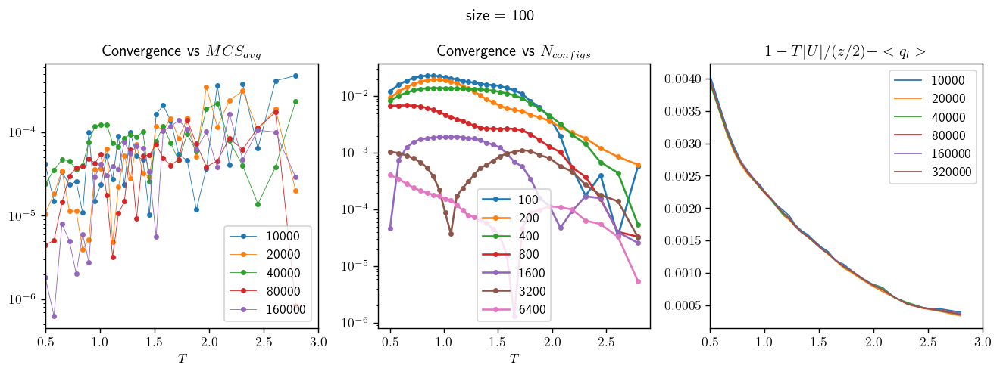

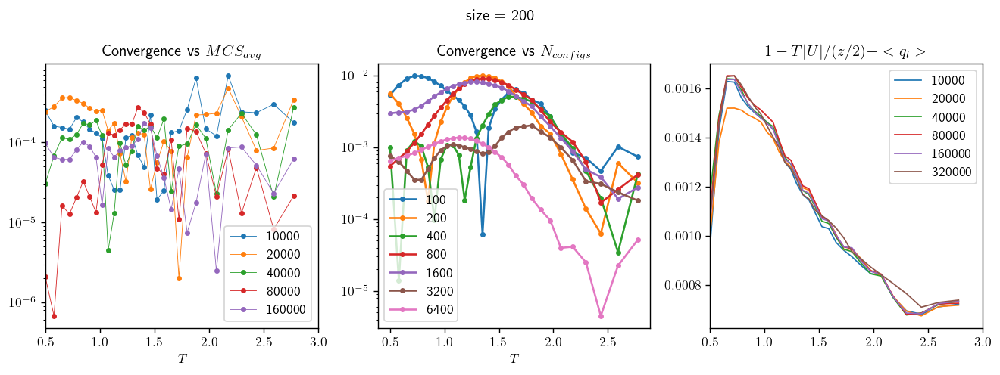

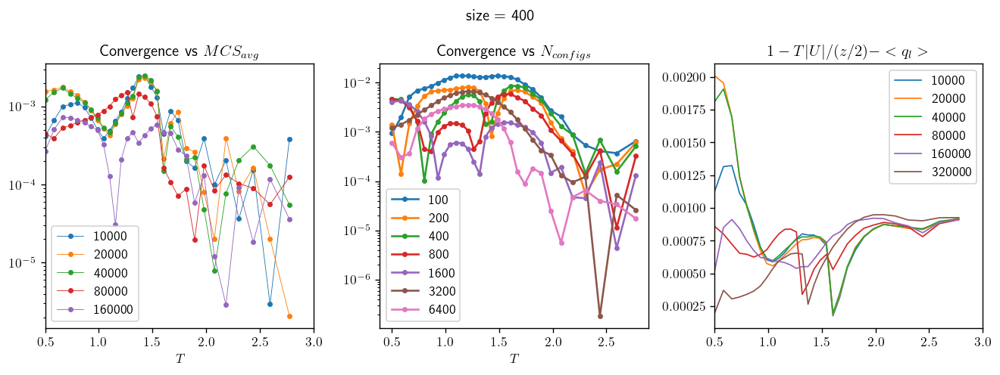

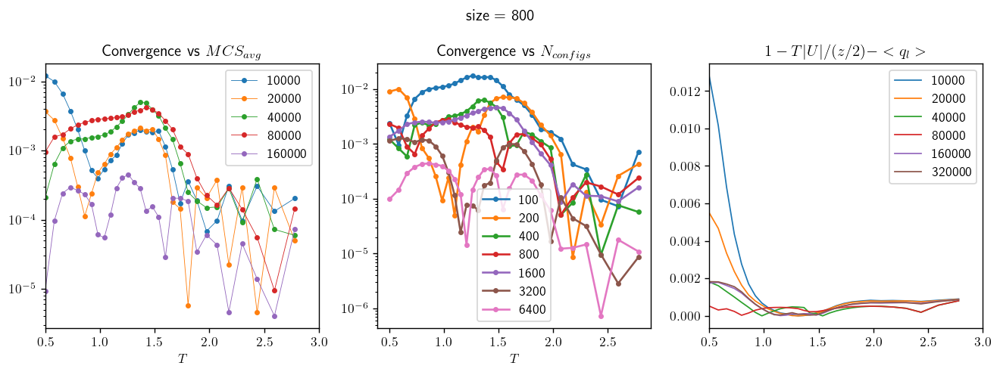

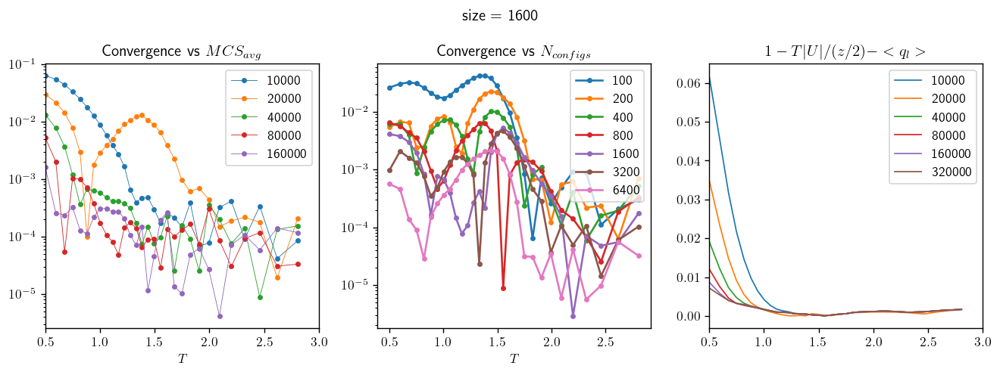

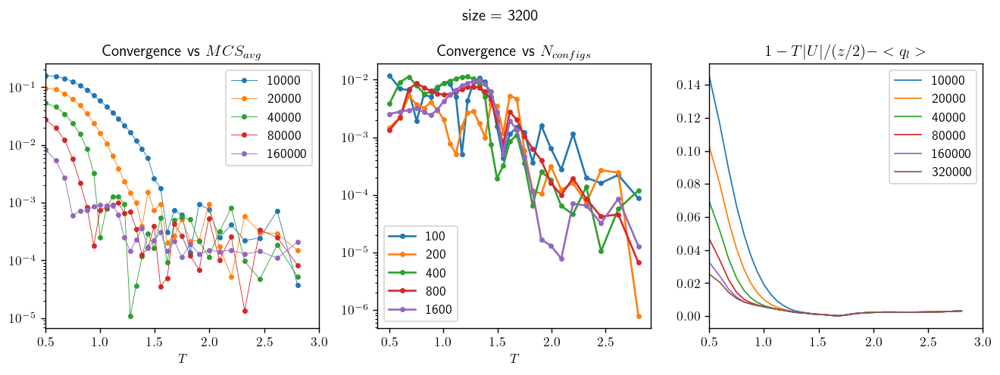

In [12]:
# Read data and plot convergence of simulations
T_vs_size, B_vs_size, error_vs_size = \
rfc.B_vs_MCSavg_Nconf(adjacency, distribution, sizes, add, T0, Tf, MCS_avg_0, max_MCSs, figsize_in=(16/1.5,6/1.5), dpi_in=125)

best estimation has order 5 6   and rchi 2.6323612508780127e-05
best estimation has order 5 6   and rchi 8.597217575562556e-05
best estimation has order 5 6   and rchi 0.0005298614937370885


/media/gabriel/D/onedrive/2021/Avaqus/Architecture_v1/Modules/pade_fits.py:124: RuntimeWarning: invalid value encountered in sqrt
  var = np.sqrt(np.sum(xchi ** 2) / ntr - mu ** 2)


best estimation has order 5 6   and rchi 0.005071713035224221
best estimation has order 5 6   and rchi 0.04862707050921494
best estimation has order 5 6   and rchi 0.09811293053496199
best estimation has order 5 7   and rchi 5.3691121696736084e-06
best estimation has order 5 7   and rchi 8.775598180035026e-06
best estimation has order 5 7   and rchi 0.00016716268648199982
best estimation has order 5 7   and rchi 0.0005731248190650875
best estimation has order 5 7   and rchi 0.009119310684838492
best estimation has order 5 7   and rchi 0.035750919897214135
[2.6323612508780127e-05, 8.597217575562556e-05, 0.0005298614937370885, 0.005071713035224221, 0.04862707050921494, 0.09811293053496199]
[-0.86008617  1.49271233]


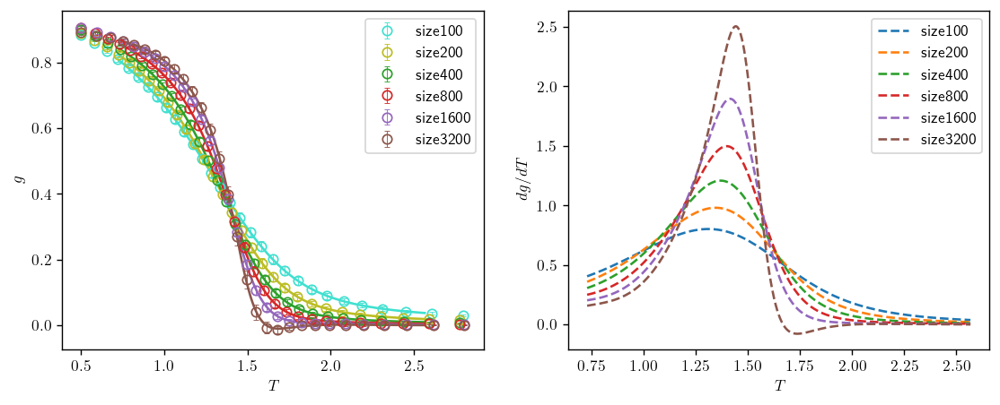

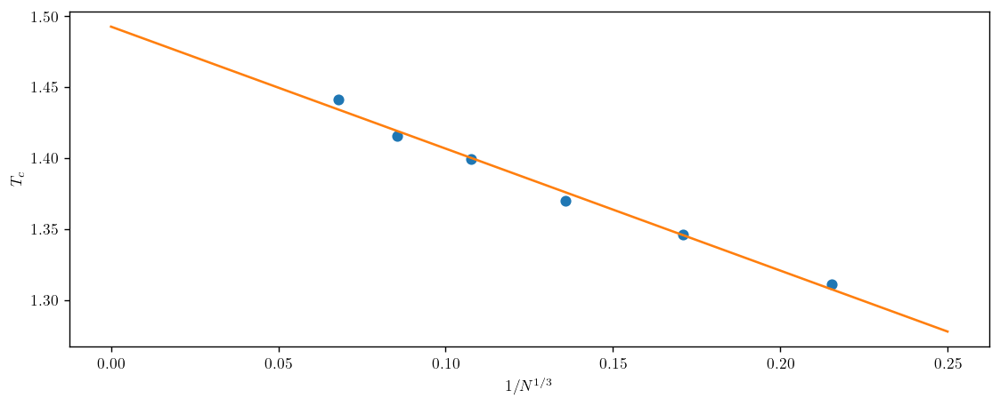

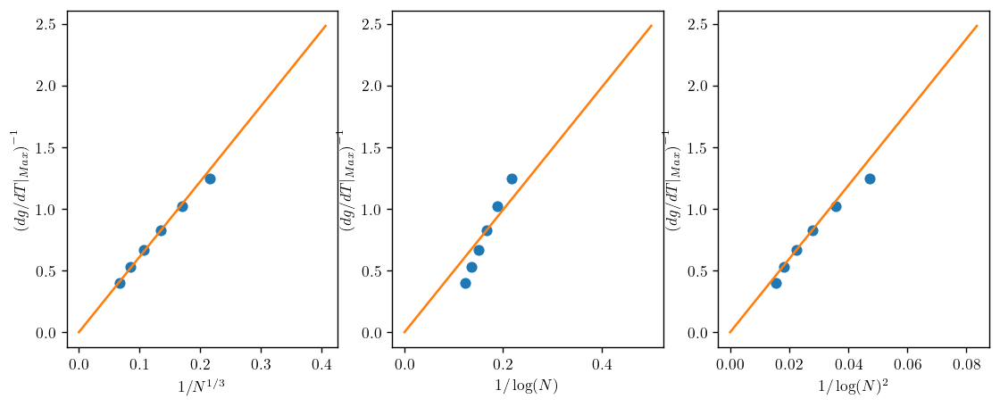

In [13]:
# Pade approximants
pf.pade_fss_analysis(sizes, T_vs_size, B_vs_size,  error_vs_size, figsize_in=(16/1.5,6/1.5), dpi_in=125)

# Random Regular, k=7

In [14]:
adj_index = 2

adjacency = adjacencies[adj_index]
T0 = T0_vs_adj[adj_index]
Tf = Tf_vs_adj[adj_index]
add = add_vs_adj[adj_index]
max_MCSs = max_MCSs_vs_adj[adj_index]

n=100, MCS_avg=20000, N_configs=10004
n=200, MCS_avg=40000, N_configs=9805
n=400, MCS_avg=160000, N_configs=2230
n=800, MCS_avg=160000, N_configs=1782
n=1600, MCS_avg=320000, N_configs=3609
n=3200, MCS_avg=640000, N_configs=1719


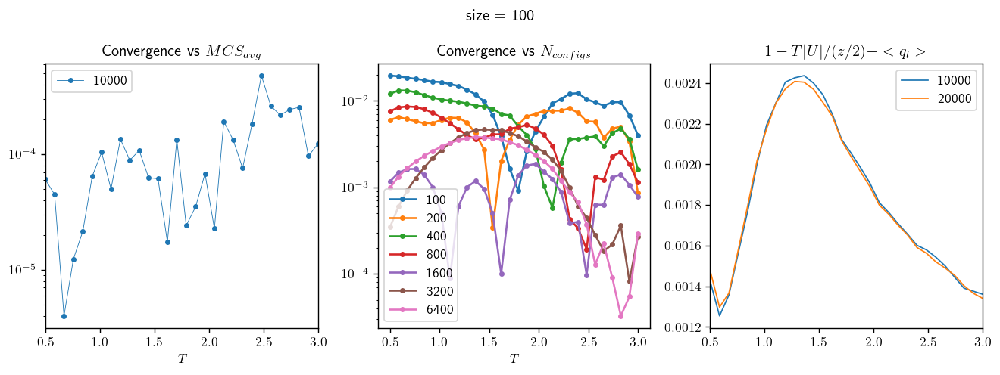

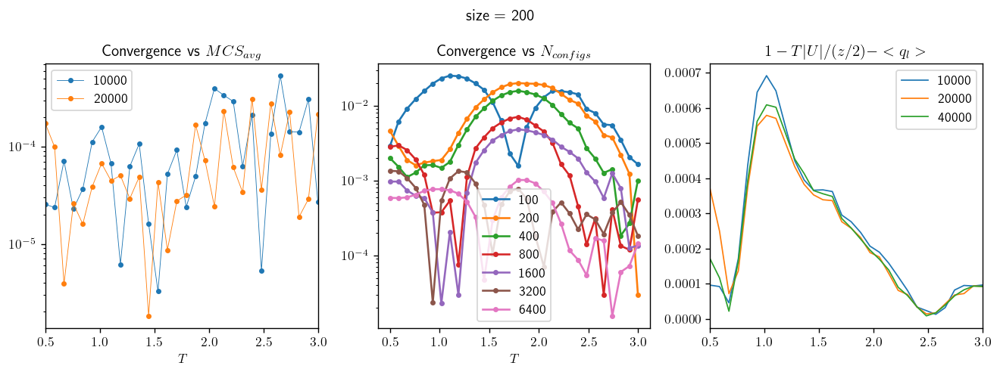

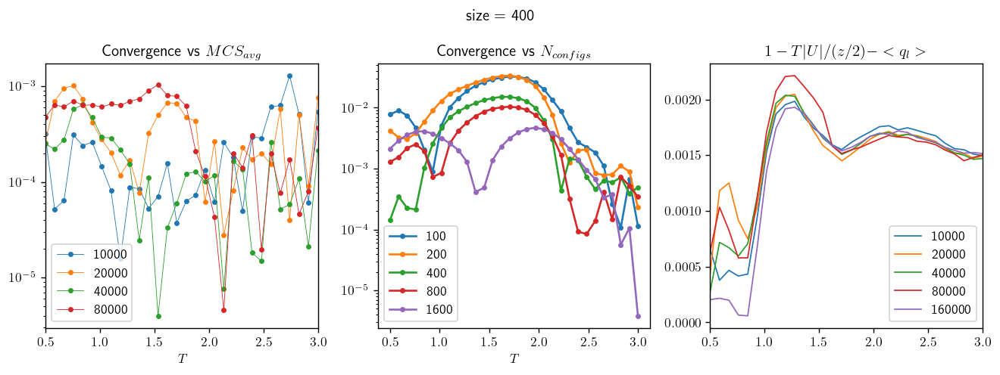

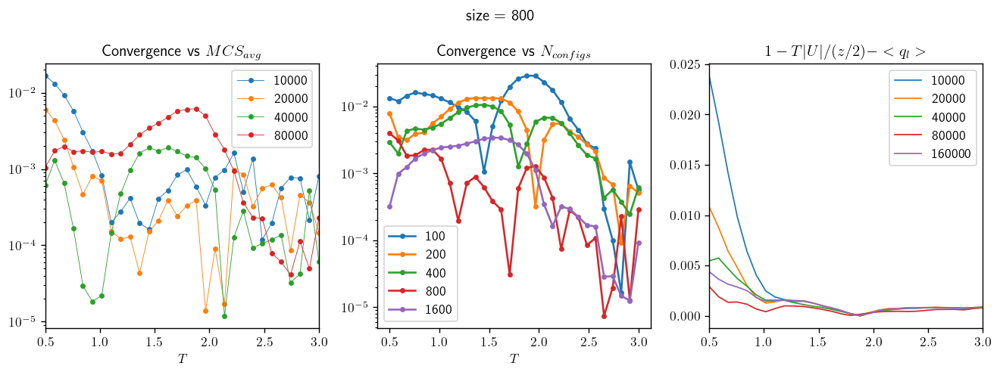

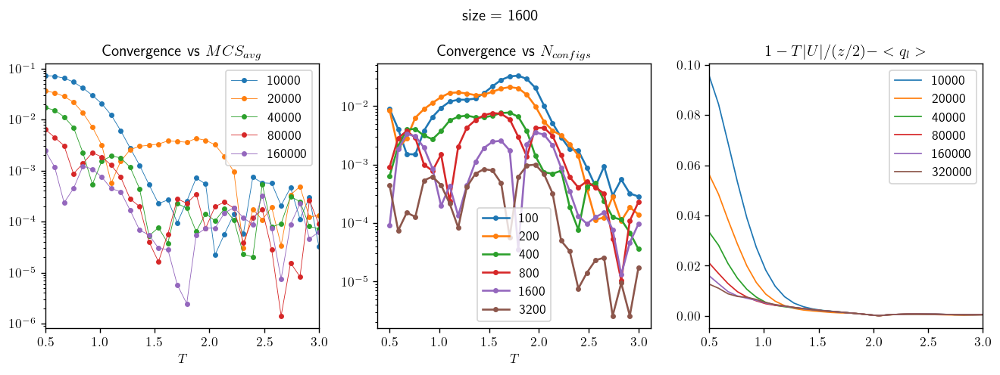

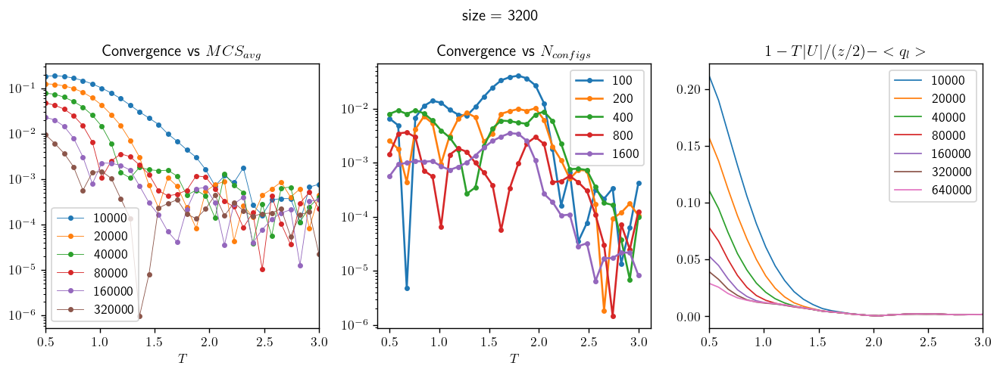

In [15]:
# Read data and plot convergence of simulations
T_vs_size, B_vs_size, error_vs_size = \
rfc.B_vs_MCSavg_Nconf(adjacency, distribution, sizes, add, T0, Tf, MCS_avg_0, max_MCSs, figsize_in=(16/1.5,6/1.5), dpi_in=125)

best estimation has order 5 6   and rchi 8.850029054231369e-05
best estimation has order 5 6   and rchi 0.00011996666421234295
best estimation has order 5 6   and rchi 0.0010280544656930562
best estimation has order 5 6   and rchi 0.0004392738683761025
best estimation has order 5 6   and rchi 0.006312069908009719


/media/gabriel/D/onedrive/2021/Avaqus/Architecture_v1/Modules/pade_fits.py:124: RuntimeWarning: invalid value encountered in sqrt
  var = np.sqrt(np.sum(xchi ** 2) / ntr - mu ** 2)


best estimation has order 5 6   and rchi 0.026676124495460377
best estimation has order 5 7   and rchi 9.256675999670284e-05
best estimation has order 5 7   and rchi 0.00010128357294649455
best estimation has order 5 7   and rchi 0.00021439479334851977
best estimation has order 5 7   and rchi 0.0003811354646340359
best estimation has order 5 7   and rchi 0.0013774243576058932
best estimation has order 5 7   and rchi 0.006789619414469207
[9.256675999670284e-05, 0.00011996666421234295, 0.0010280544656930562, 0.0004392738683761025, 0.006312069908009719, 0.026676124495460377]
[-0.93491264  1.97281138]


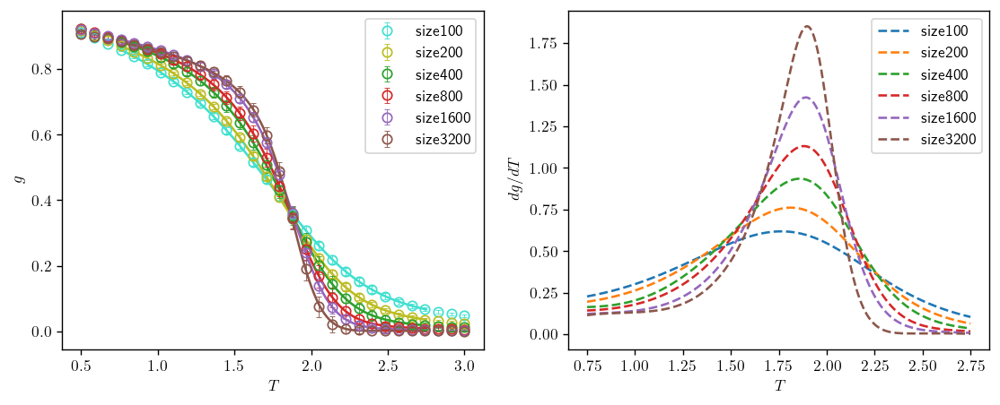

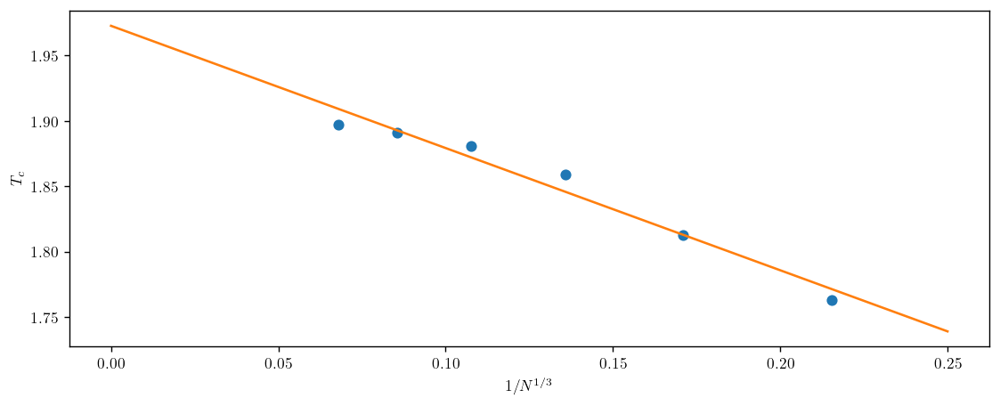

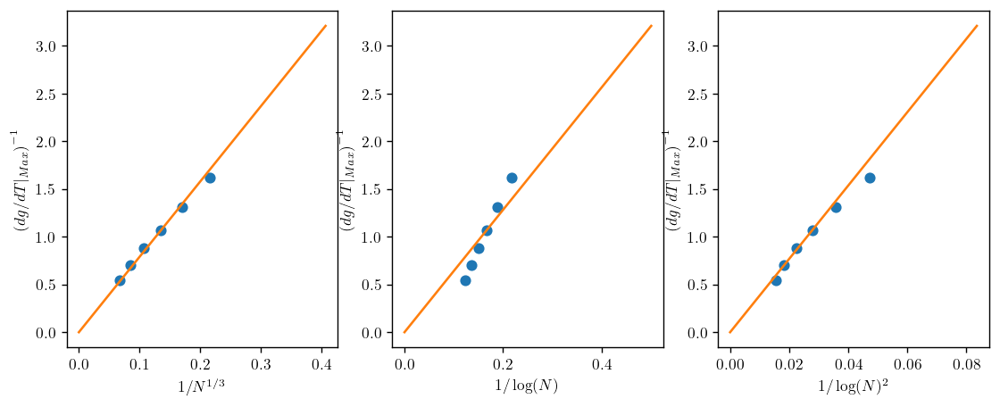

In [16]:
# Pade approximants
pf.pade_fss_analysis(sizes, T_vs_size, B_vs_size, error_vs_size, figsize_in=(16/1.5,6/1.5), dpi_in=125)

# Random Regular, k=9

In [135]:
adj_index = 3

adjacency = adjacencies[adj_index]
T0 = T0_vs_adj[adj_index]
Tf = Tf_vs_adj[adj_index]
add = add_vs_adj[adj_index]
max_MCSs = max_MCSs_vs_adj[adj_index]

n=100, MCS_avg=20000, N_configs=20009
n=200, MCS_avg=40000, N_configs=24614
n=400, MCS_avg=160000, N_configs=8758
n=800, MCS_avg=320000, N_configs=4256
n=1600, MCS_avg=320000, N_configs=2534
n=3200, MCS_avg=640000, N_configs=1053


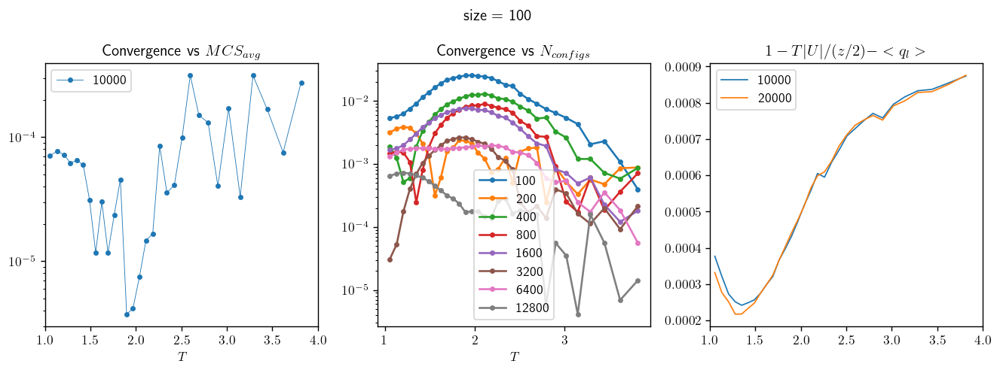

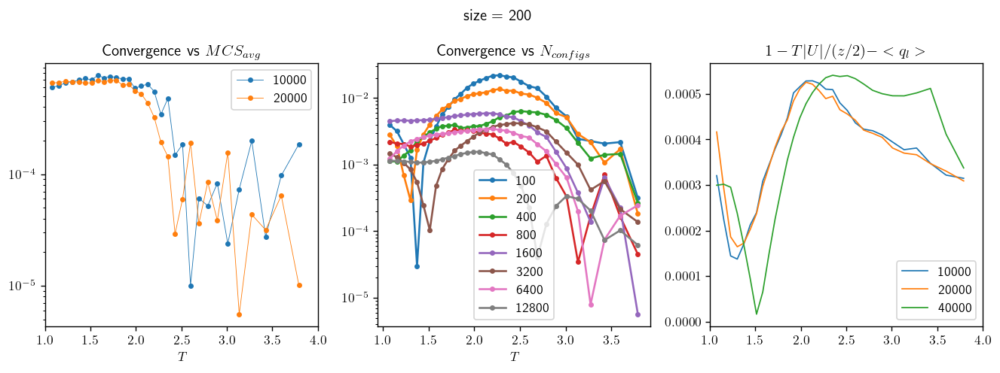

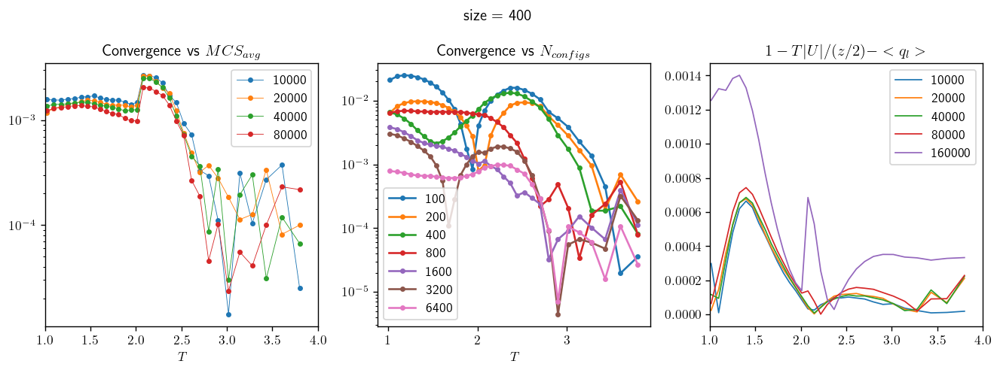

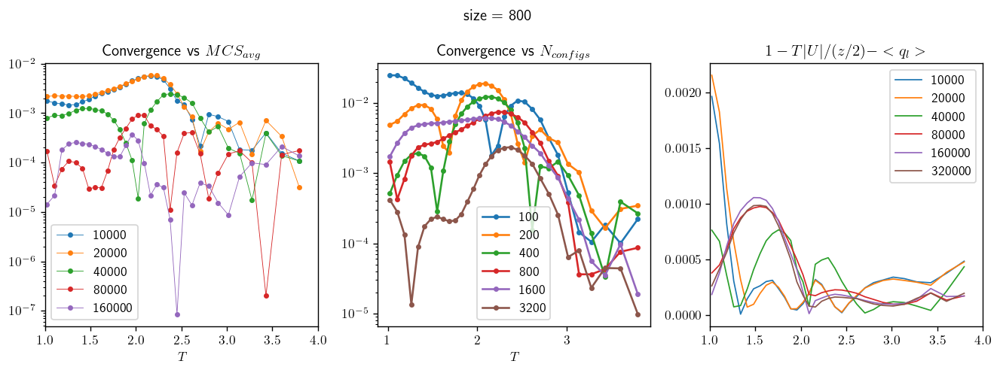

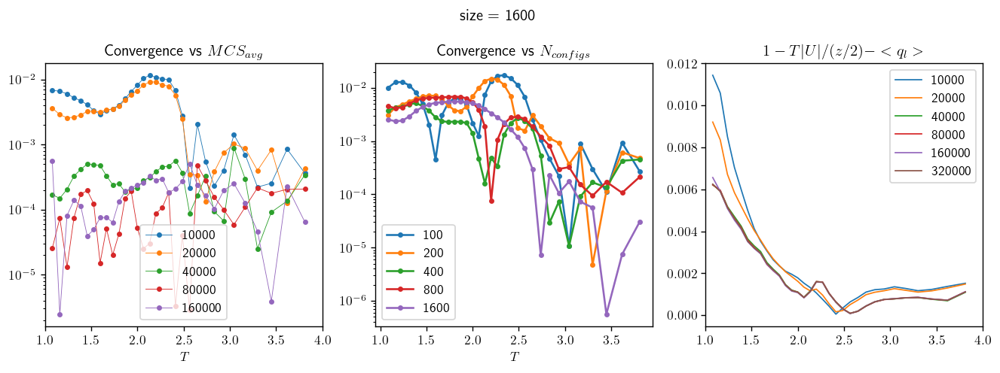

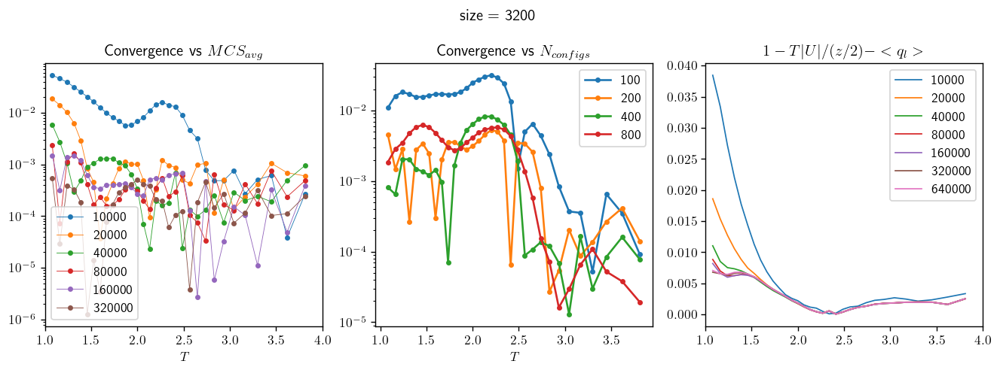

In [92]:
# Read data and plot convergence of simulations
T_vs_size, B_vs_size, error_vs_size = \
rfc.B_vs_MCSavg_Nconf(adjacency, distribution, sizes, add, T0, Tf, MCS_avg_0, max_MCSs, figsize_in=(16/1.5,6/1.5), dpi_in=125)

/tmp/ipykernel_22446/1338972739.py:16: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  fT, fT_d, d2T, l_rchi = pf.pade_best(Tfit[0:nf], Ofit[0:nf], np.array(Ofit_er[0:nf]), ntr=ntr, ic=ic, jc=jc)


best estimation has order 6 7   and rchi 6.622310636587029e-05
best estimation has order 6 7   and rchi 3.6704355449019725e-05
best estimation has order 6 7   and rchi 0.00027593120904434307
best estimation has order 6 7   and rchi 2.0400802969042787e-05
best estimation has order 6 7   and rchi 0.0008397815852894001
best estimation has order 6 7   and rchi 0.00045881977492233785
[6.622310636587029e-05, 3.6704355449019725e-05, 0.00027593120904434307, 2.0400802969042787e-05, 0.0008397815852894001, 0.00045881977492233785]
[-1.4072209   2.42726632]


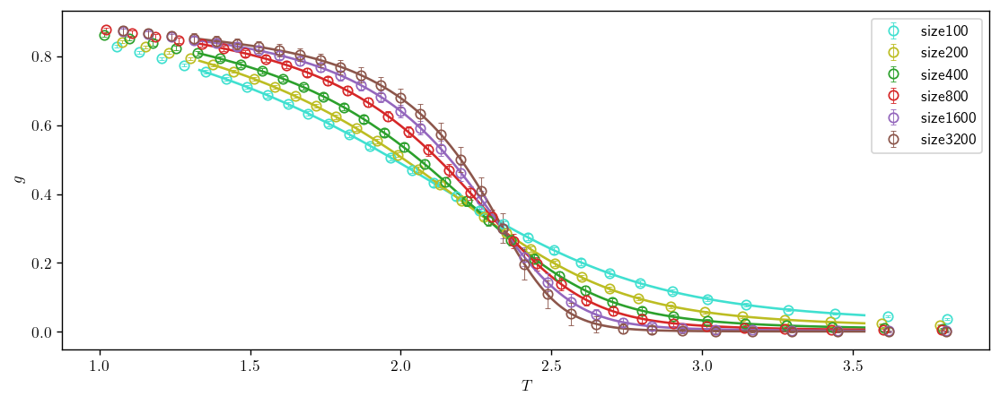

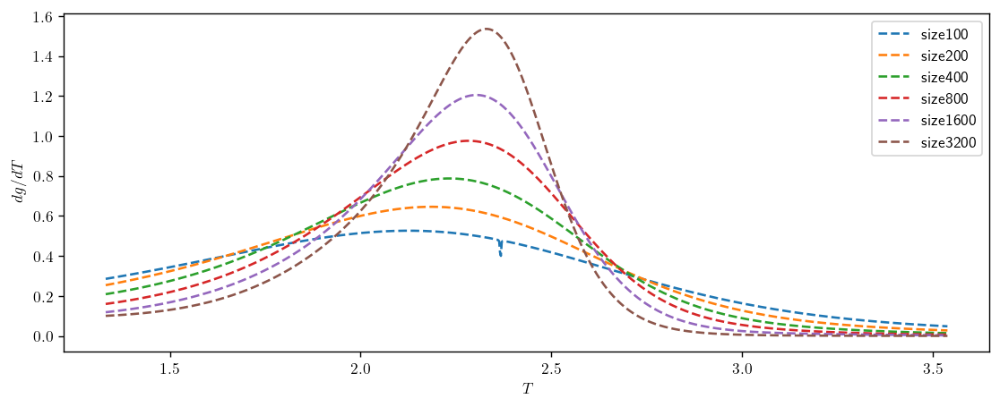

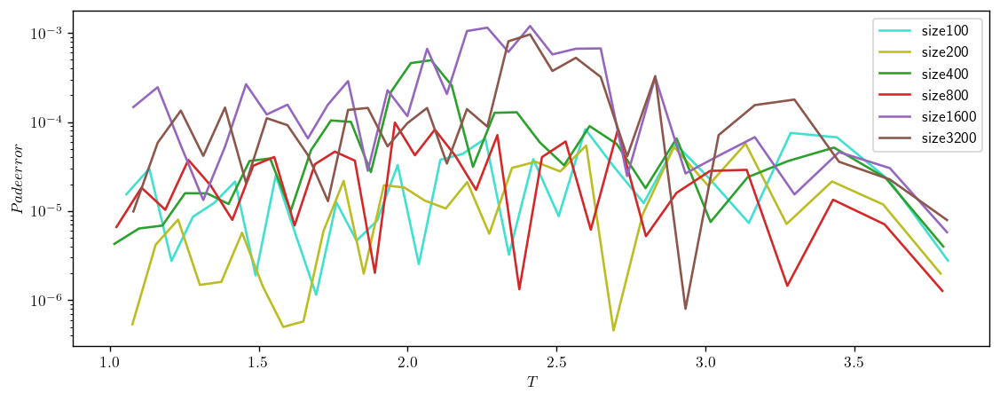

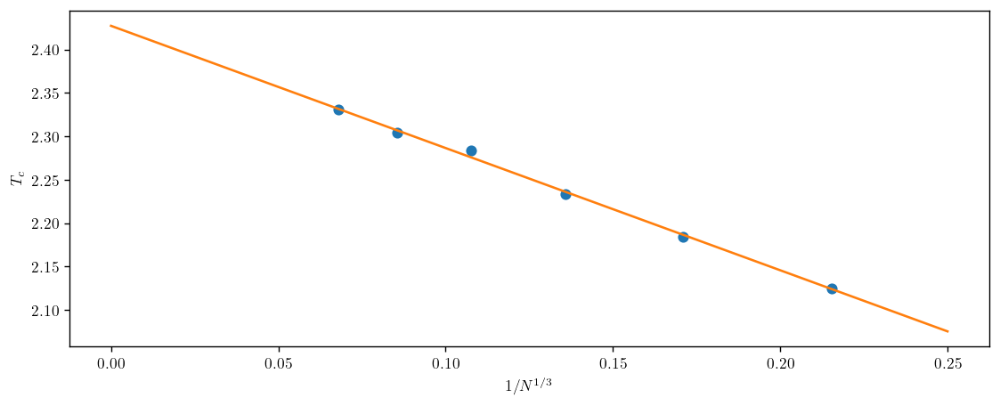

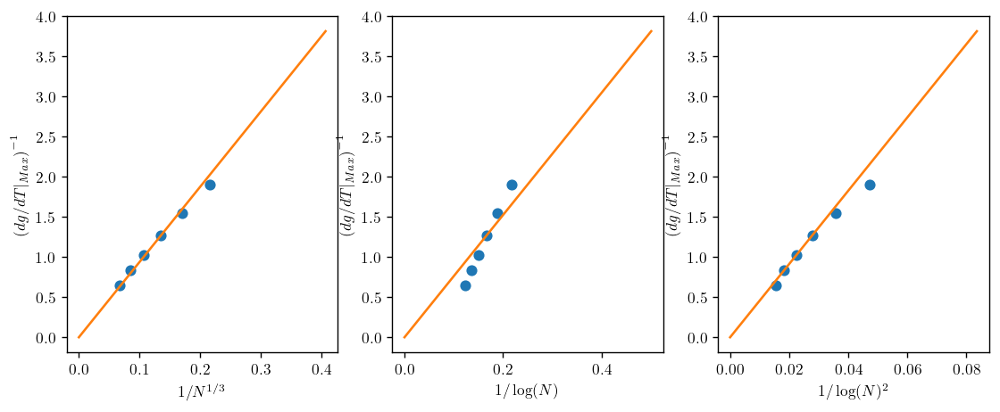

In [172]:
# Pade approximants
pf.pade_fss_analysis(sizes, T_vs_size, B_vs_size,  error_vs_size, T_term=0,  ntr=1, ic=[6], jc=[7], figsize_in=(16/1.5,6/1.5), dpi_in=125)

# 1D+ , add=3

In [20]:
adj_index = 4

adjacency = adjacencies[adj_index]
T0 = T0_vs_adj[adj_index]
Tf = Tf_vs_adj[adj_index]
add = add_vs_adj[adj_index]
max_MCSs = max_MCSs_vs_adj[adj_index]

n=100, MCS_avg=40000, N_configs=13418
n=200, MCS_avg=40000, N_configs=12425
n=400, MCS_avg=80000, N_configs=2243
n=800, MCS_avg=160000, N_configs=3344
n=1600, MCS_avg=320000, N_configs=1610
n=3200, MCS_avg=640000, N_configs=618


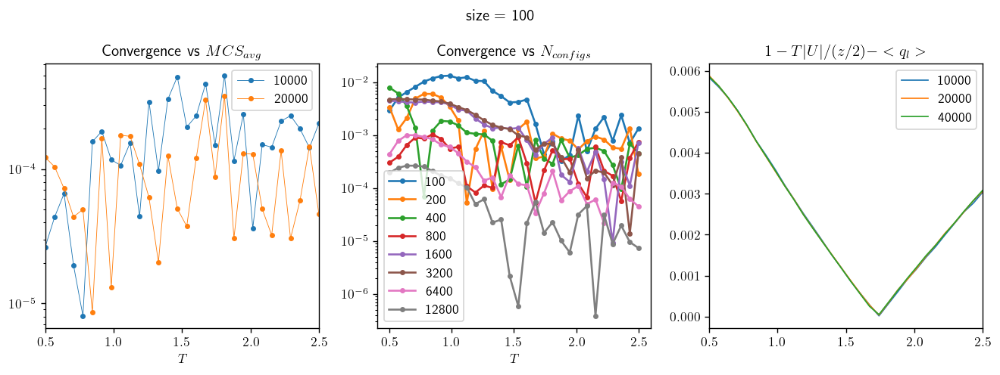

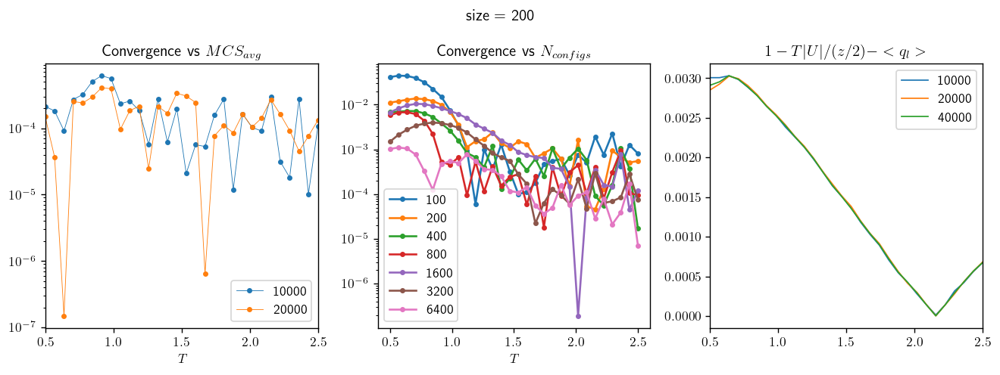

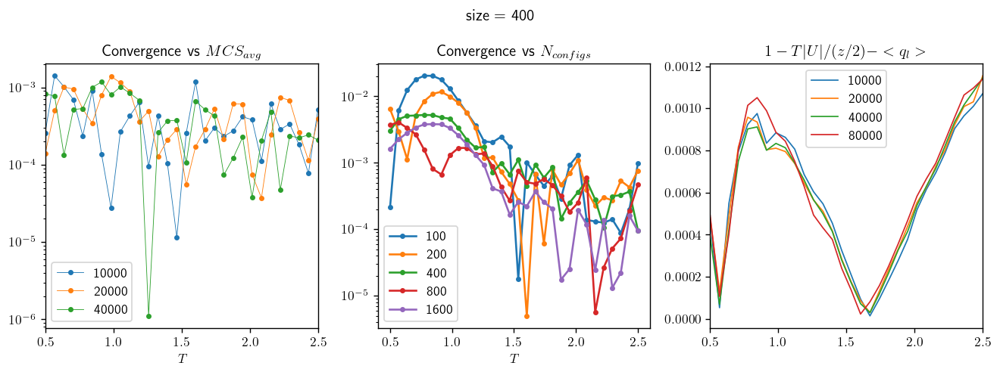

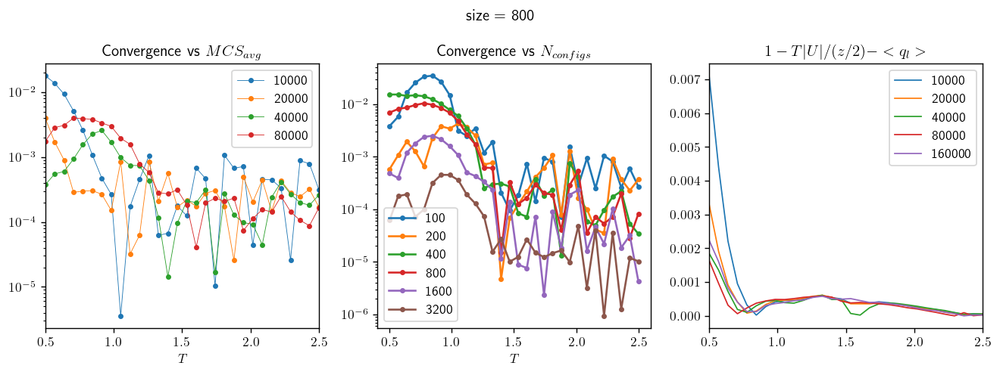

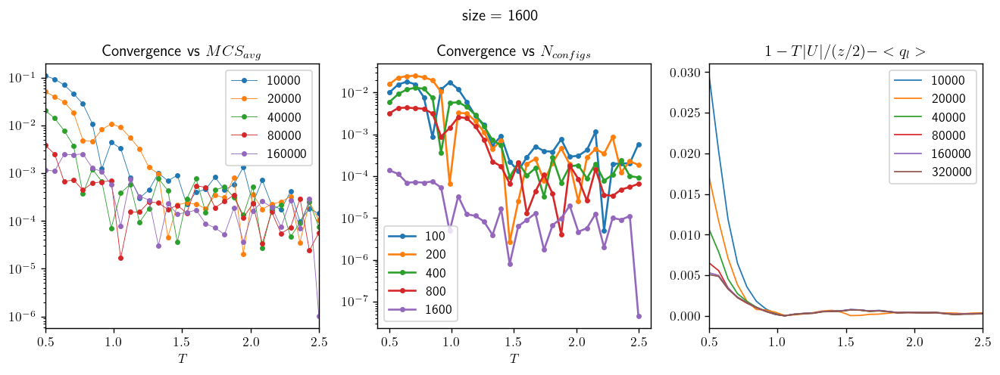

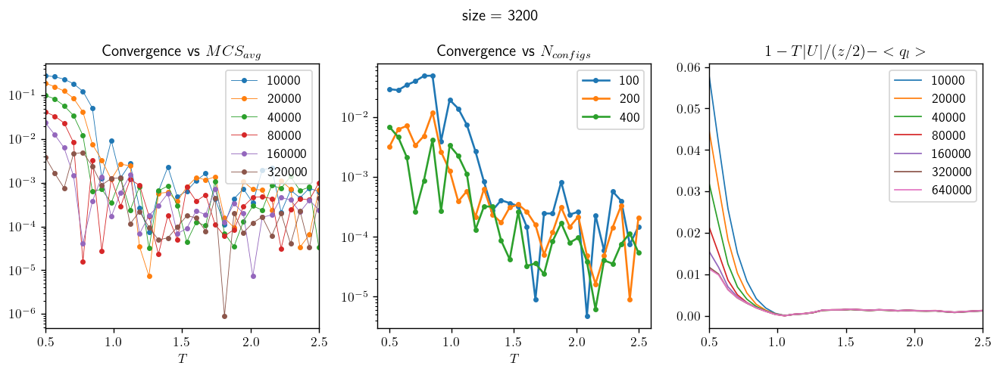

In [21]:
# Read data and plot convergence of simulations
T_vs_size, B_vs_size, error_vs_size = \
rfc.B_vs_MCSavg_Nconf(adjacency, distribution, sizes, add, T0, Tf, MCS_avg_0, max_MCSs, figsize_in=(16/1.5,6/1.5), dpi_in=125)

best estimation has order 5 6   and rchi 0.0017444703379185592
best estimation has order 5 6   and rchi 0.0006180931098416368
best estimation has order 5 6   and rchi 0.001261775077288175
best estimation has order 5 6   and rchi 0.0014207248634653118
best estimation has order 5 6   and rchi 0.0015520085003086891
best estimation has order 5 6   and rchi 0.0034765709048689463
best estimation has order 5 7   and rchi 0.0017985392951042562
best estimation has order 5 7   and rchi 0.0005891514551781915
best estimation has order 5 7   and rchi 0.00129668440177383
best estimation has order 5 7   and rchi 0.0014382982109541881
best estimation has order 5 7   and rchi 0.001175626009433177


/media/gabriel/D/onedrive/2021/Avaqus/Architecture_v1/Modules/pade_fits.py:124: RuntimeWarning: invalid value encountered in sqrt
  var = np.sqrt(np.sum(xchi ** 2) / ntr - mu ** 2)


best estimation has order 5 7   and rchi 0.0033721996632585507
[0.0017985392951042562, 0.0006180931098416368, 0.00129668440177383, 0.0014382982109541881, 0.0015520085003086891, 0.0034765709048689463]
[-0.76275557  0.90420845]


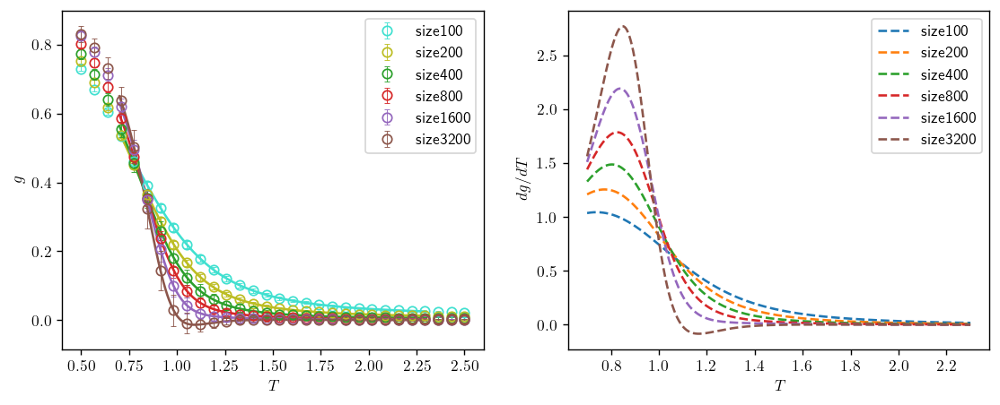

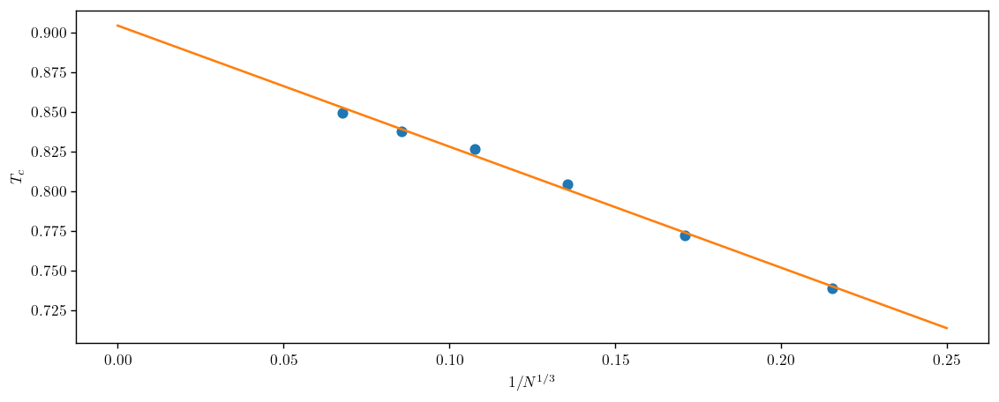

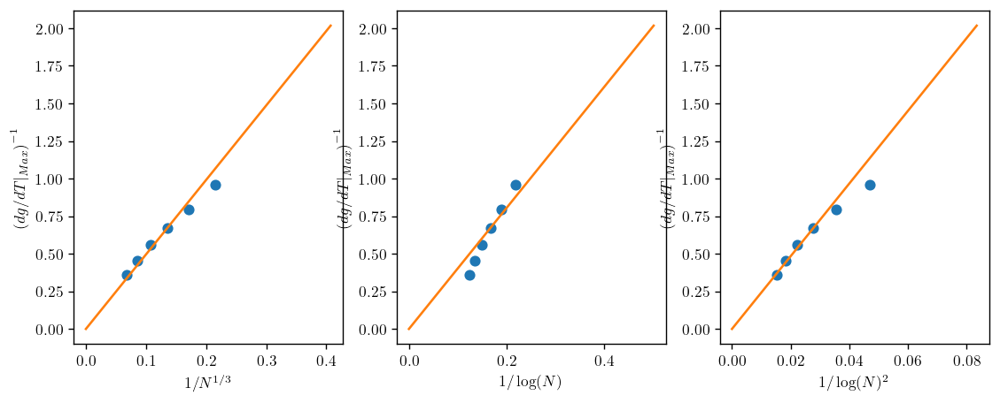

In [22]:
# Pade approximants
pf.pade_fss_analysis(sizes, T_vs_size, B_vs_size,  error_vs_size, figsize_in=(16/1.5,6/1.5), dpi_in=125)

# 1D+ , add=5

In [9]:
adj_index = 5

adjacency = adjacencies[adj_index]
T0 = T0_vs_adj[adj_index]
Tf = Tf_vs_adj[adj_index]
add = add_vs_adj[adj_index]
max_MCSs = max_MCSs_vs_adj[adj_index]

n=100, MCS_avg=40000, N_configs=14171
n=200, MCS_avg=40000, N_configs=14800
n=400, MCS_avg=80000, N_configs=13671
n=800, MCS_avg=160000, N_configs=5910
n=1600, MCS_avg=320000, N_configs=2302
n=3200, MCS_avg=640000, N_configs=264


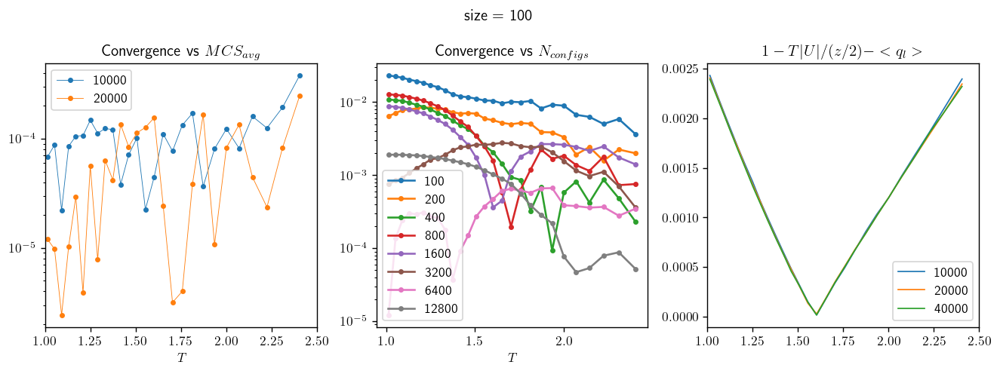

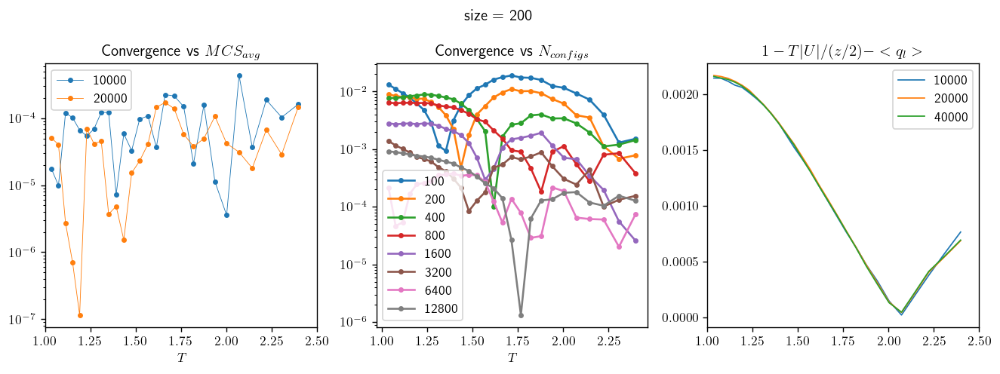

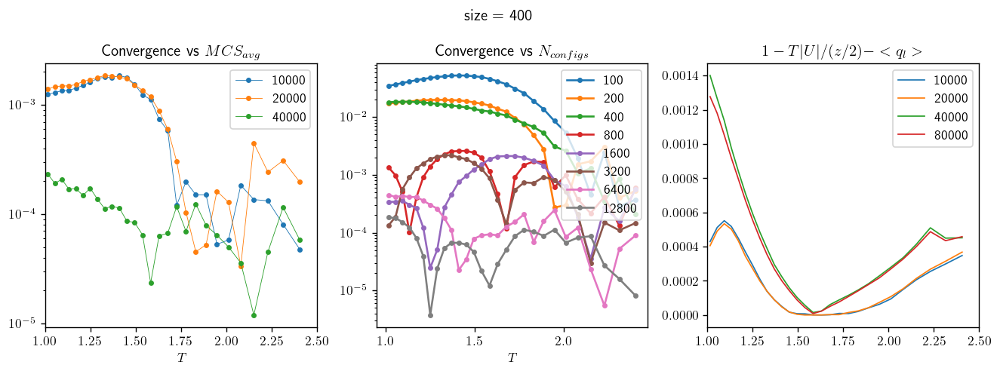

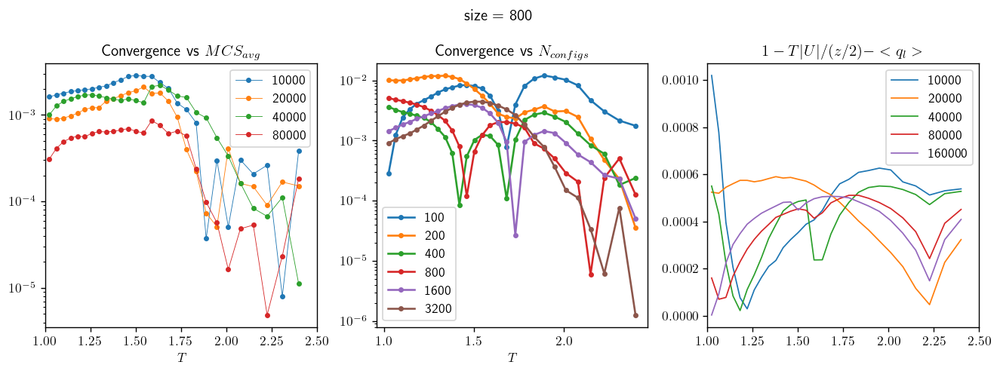

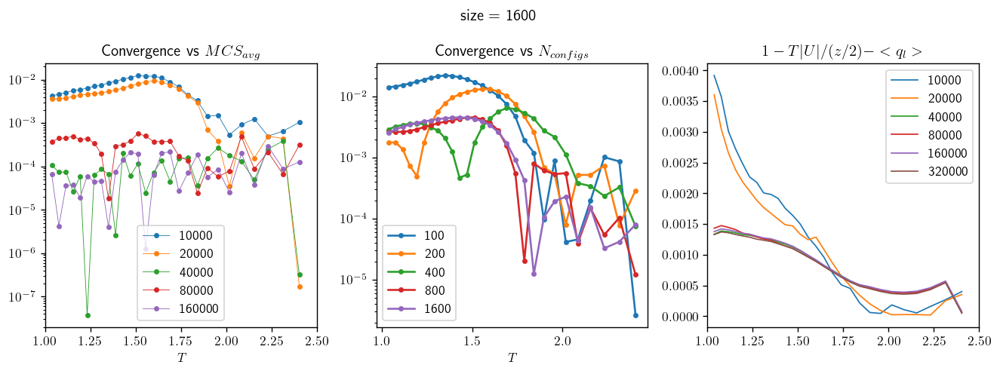

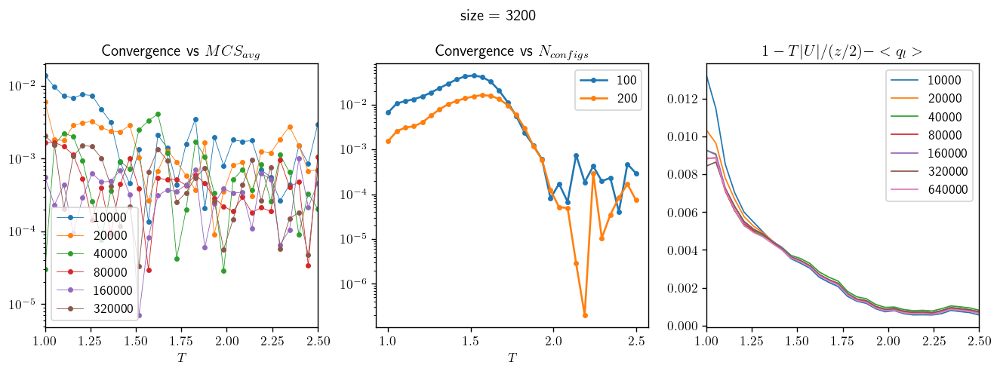

In [10]:
# Read data and plot convergence of simulations
T_vs_size, B_vs_size, error_vs_size = \
rfc.B_vs_MCSavg_Nconf(adjacency, distribution, sizes, add, T0, Tf, MCS_avg_0, max_MCSs, figsize_in=(16/1.5,6/1.5), dpi_in=125)

/home/gabriel/OneDrive/2021/Avaqus/Architecture_v2/Modules/pade_fits.py:389: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  fT, fT_d, d2T, l_rchi = pade_best(Tfit[0:nf], Ofit[0:nf], np.array(Ofit_er[0:nf]), ntr=4, ic=[5], jc=[6, 7])


best estimation has order 5 6   and rchi 1.1671407627725952e-05
best estimation has order 5 6   and rchi 1.928240960186159e-05
best estimation has order 5 6   and rchi 2.502155390908353e-05
best estimation has order 5 6   and rchi 8.04361707533521e-06
best estimation has order 5 6   and rchi 8.205021376427062e-05
best estimation has order 5 6   and rchi 0.00031051394991633683
best estimation has order 5 7   and rchi 8.250211768413952e-06
best estimation has order 5 7   and rchi 1.6424675896711088e-05
best estimation has order 5 7   and rchi 2.656290906373423e-05
best estimation has order 5 7   and rchi 5.864153112465538e-06
best estimation has order 5 7   and rchi 8.09829807503571e-05
best estimation has order 5 7   and rchi 0.0002846165169803606
[1.1671407627725952e-05, 1.928240960186159e-05, 2.656290906373423e-05, 8.04361707533521e-06, 8.205021376427062e-05, 0.00031051394991633683]
[-1.21775869  1.65894885]


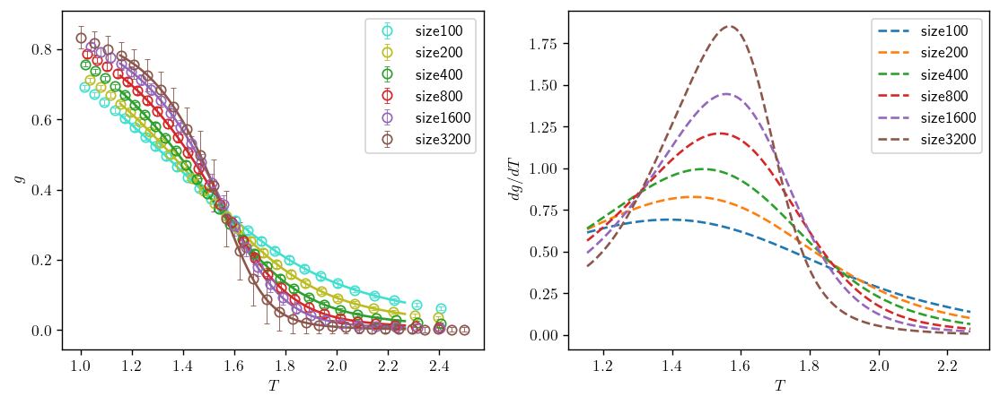

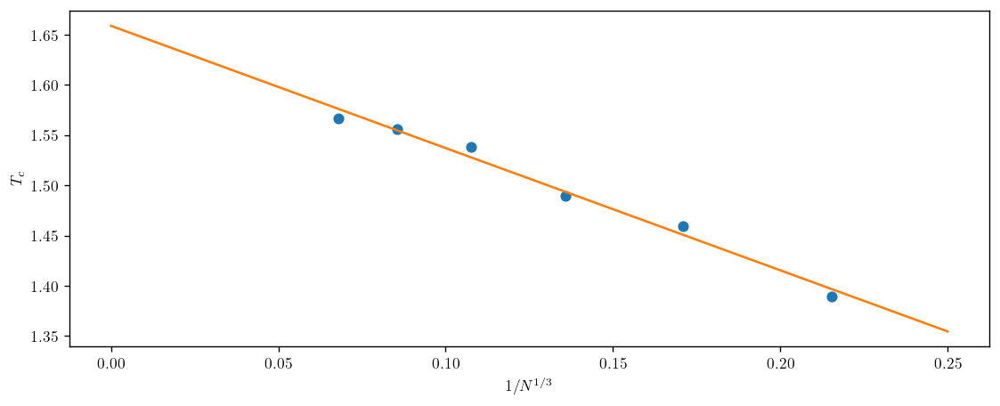

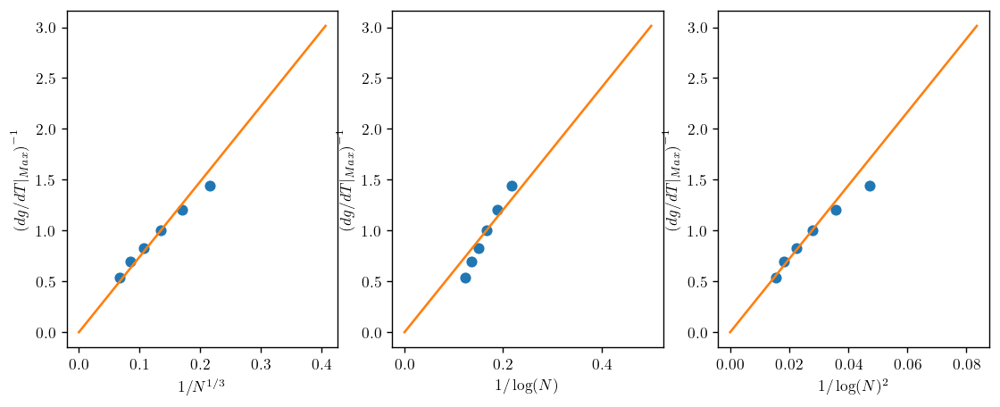

In [11]:
# Pade approximants
pf.pade_fss_analysis(sizes, T_vs_size, B_vs_size,  error_vs_size, figsize_in=(16/1.5,6/1.5), dpi_in=125)

# 1D+ , add=7

In [12]:
adj_index = 6

adjacency = adjacencies[adj_index]
T0 = T0_vs_adj[adj_index]
Tf = Tf_vs_adj[adj_index]
add = add_vs_adj[adj_index]
max_MCSs = max_MCSs_vs_adj[adj_index]

n=100, MCS_avg=40000, N_configs=10609
n=200, MCS_avg=40000, N_configs=10255
n=400, MCS_avg=80000, N_configs=9311
n=800, MCS_avg=160000, N_configs=4677
n=1600, MCS_avg=320000, N_configs=4099
n=3200, MCS_avg=640000, N_configs=646


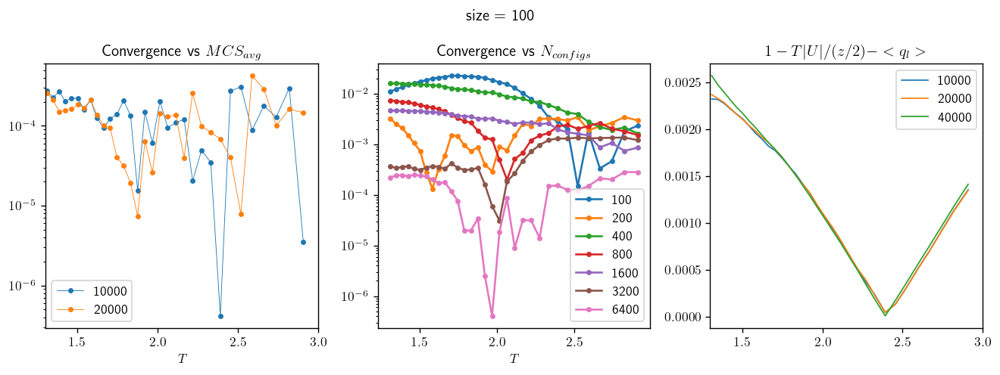

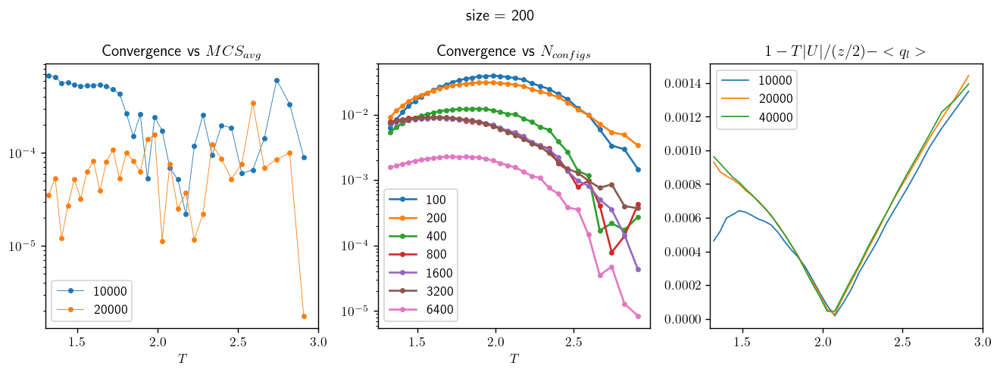

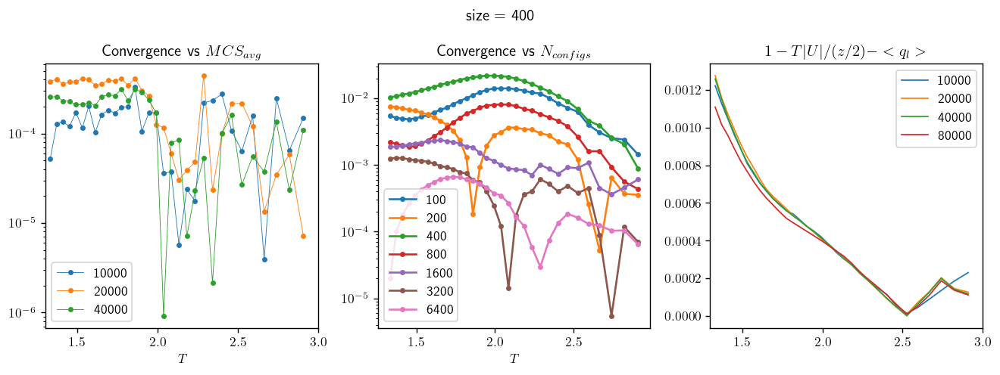

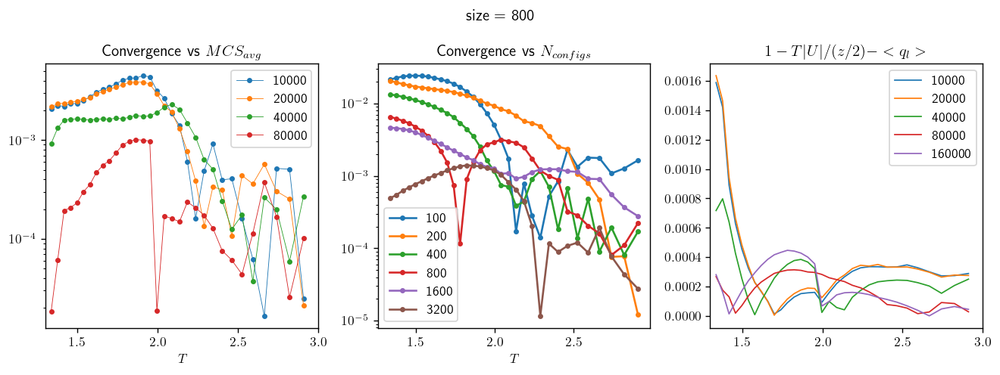

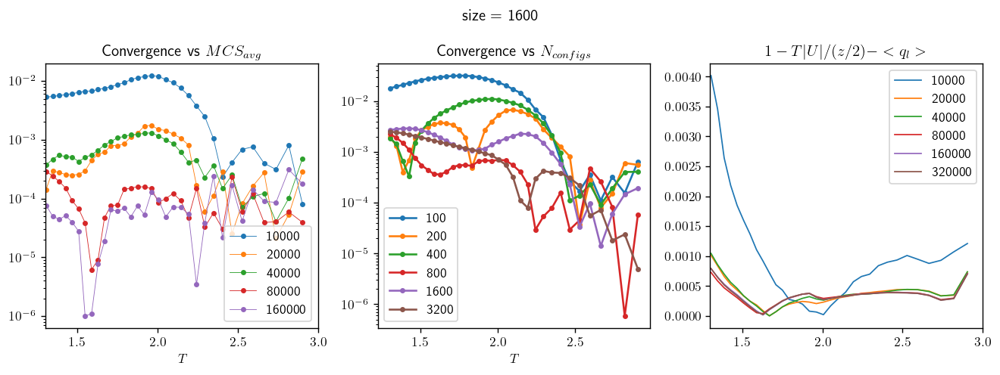

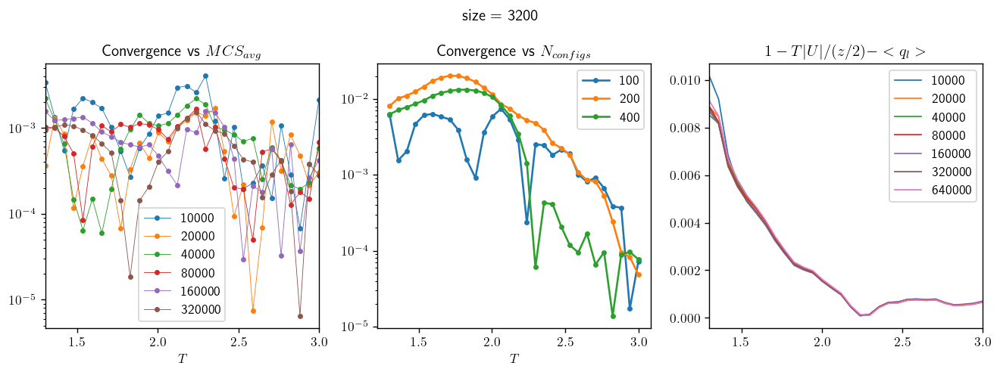

In [13]:
# Read data and plot convergence of simulations
T_vs_size, B_vs_size, error_vs_size = \
rfc.B_vs_MCSavg_Nconf(adjacency, distribution, sizes, add, T0, Tf, MCS_avg_0, max_MCSs, figsize_in=(16/1.5,6/1.5), dpi_in=125)

/home/gabriel/OneDrive/2021/Avaqus/Architecture_v2/Modules/pade_fits.py:389: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  fT, fT_d, d2T, l_rchi = pade_best(Tfit[0:nf], Ofit[0:nf], np.array(Ofit_er[0:nf]), ntr=4, ic=[5], jc=[6, 7])


best estimation has order 5 6   and rchi 8.84442982676262e-06
best estimation has order 5 6   and rchi 2.0340538469963475e-05
best estimation has order 5 6   and rchi 1.326968032116127e-05
best estimation has order 5 6   and rchi 4.895883319332109e-05
best estimation has order 5 6   and rchi 3.315643388511542e-05
best estimation has order 5 6   and rchi 0.00010359472453126003
best estimation has order 5 7   and rchi 9.323235936435266e-06
best estimation has order 5 7   and rchi 2.1717403227240306e-05
best estimation has order 5 7   and rchi 1.3259317836786737e-05
best estimation has order 5 7   and rchi 4.9468619336720806e-05
best estimation has order 5 7   and rchi 2.456429427384307e-05
best estimation has order 5 7   and rchi 0.00010719715997303698
[9.323235936435266e-06, 2.1717403227240306e-05, 1.326968032116127e-05, 4.9468619336720806e-05, 3.315643388511542e-05, 0.00010719715997303698]
[-1.4705273   2.16262461]


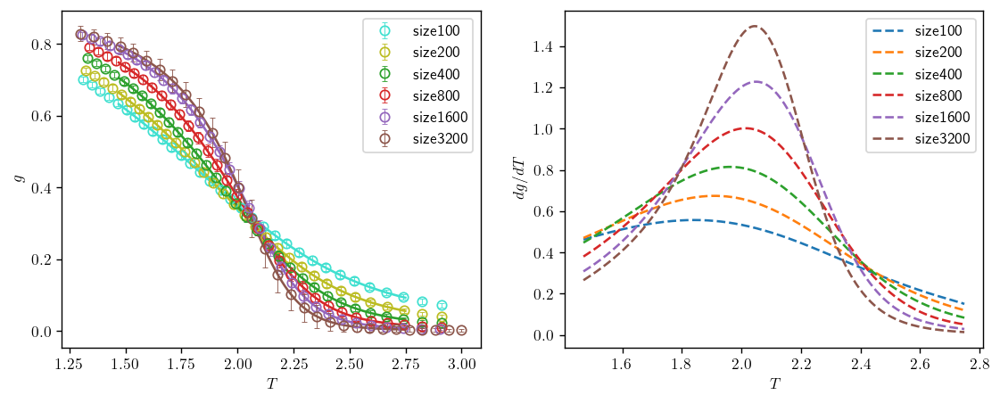

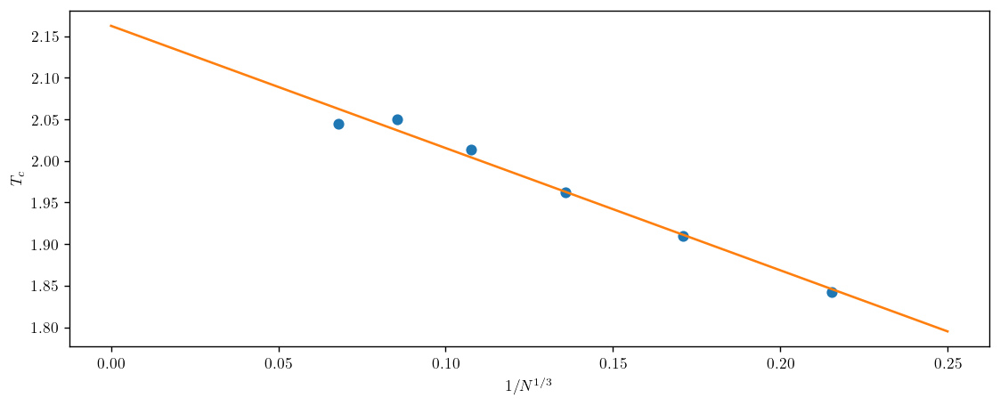

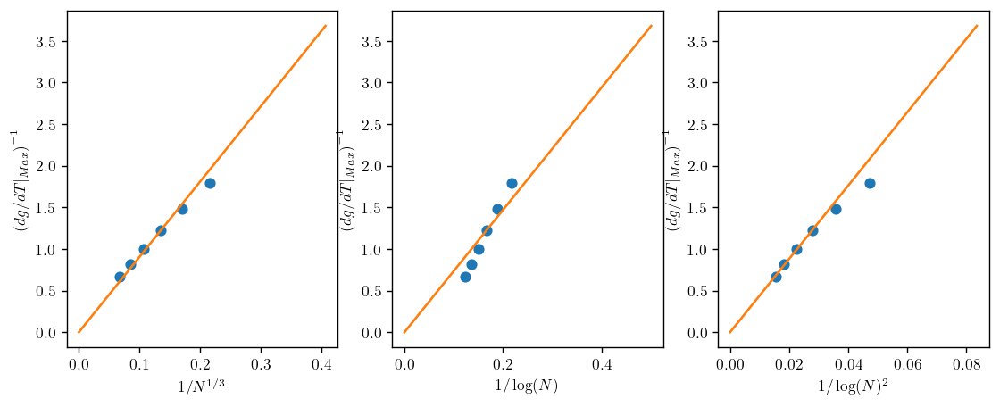

In [14]:
# Pade approximants
pf.pade_fss_analysis(sizes, T_vs_size, B_vs_size,  error_vs_size, figsize_in=(16/1.5,6/1.5), dpi_in=125)

# 1D+ , add=9

In [4]:
adj_index = 7

adjacency = adjacencies[adj_index]
T0 = T0_vs_adj[adj_index]
Tf = Tf_vs_adj[adj_index]
add = add_vs_adj[adj_index]
max_MCSs = max_MCSs_vs_adj[adj_index]

n=100, MCS_avg=40000, N_configs=16056
n=200, MCS_avg=40000, N_configs=15656
n=400, MCS_avg=80000, N_configs=14025
n=800, MCS_avg=160000, N_configs=6635
n=1600, MCS_avg=320000, N_configs=4342
n=3200, MCS_avg=640000, N_configs=1189


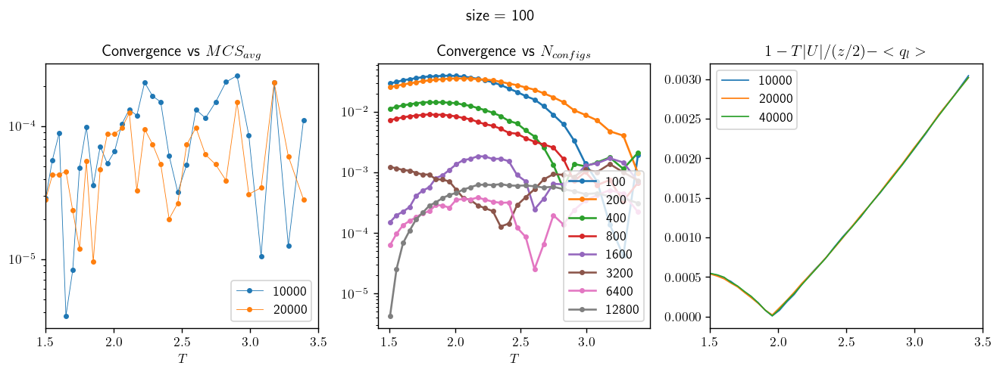

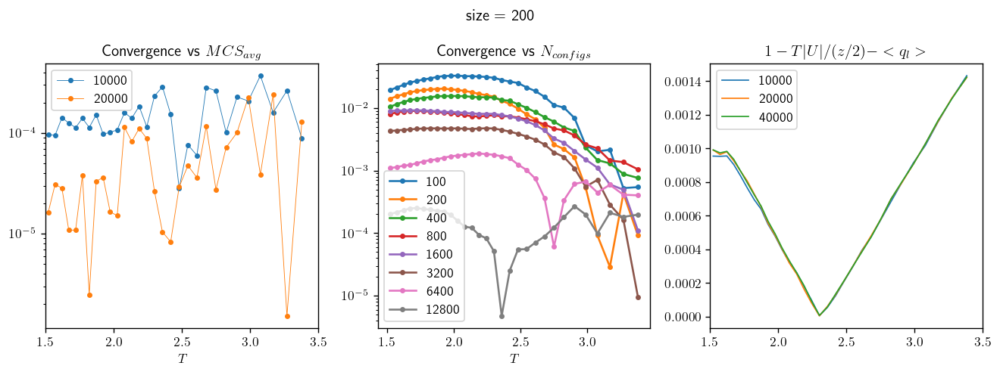

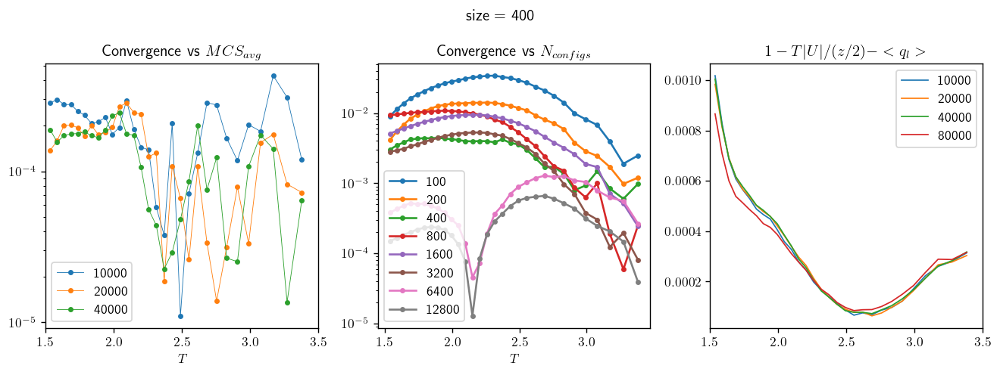

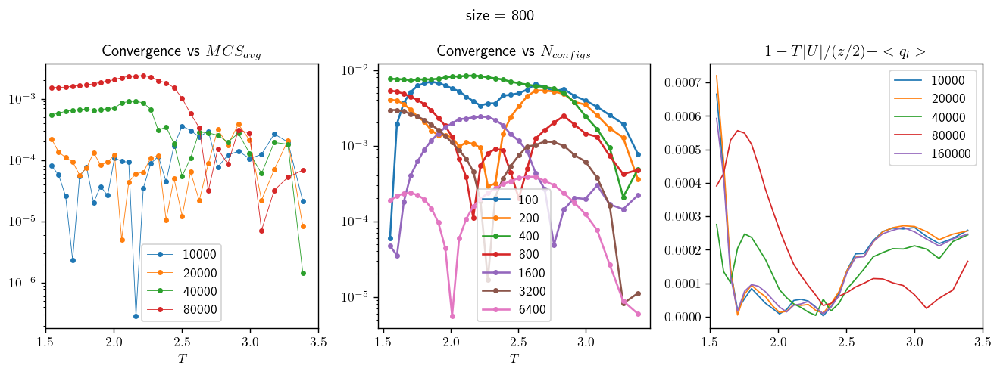

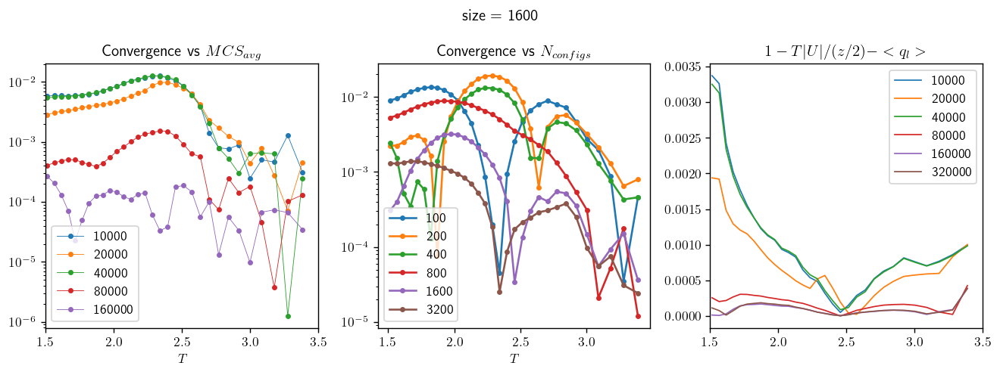

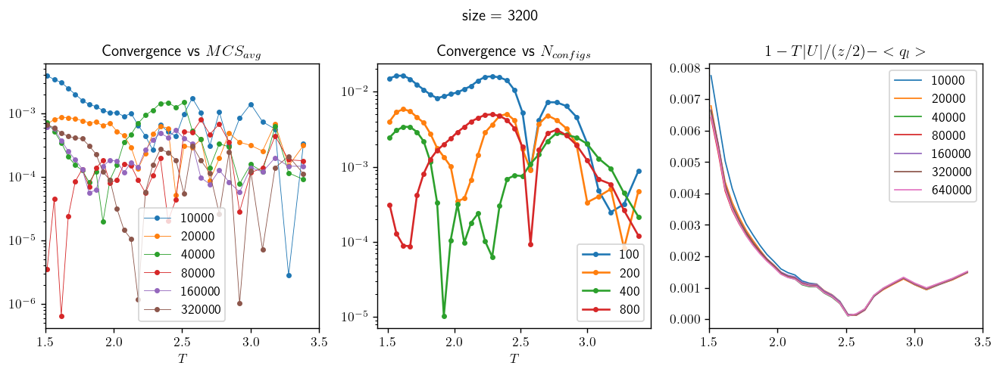

In [5]:
# Read data and plot convergence of simulations
T_vs_size, B_vs_size, error_vs_size = \
rfc.B_vs_MCSavg_Nconf(adjacency, distribution, sizes, add, T0, Tf, MCS_avg_0, max_MCSs, figsize_in=(16/1.5,6/1.5), dpi_in=125)

/home/gabriel/OneDrive/2021/Avaqus/Architecture_v2/Modules/pade_fits.py:389: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  fT, fT_d, d2T, l_rchi = pade_best(Tfit[0:nf], Ofit[0:nf], np.array(Ofit_er[0:nf]), ntr=4, ic=[5], jc=[6, 7])


best estimation has order 5 6   and rchi 1.3970220567057538e-05
best estimation has order 5 6   and rchi 5.0136463197529576e-05
best estimation has order 5 6   and rchi 4.585544430704529e-05
best estimation has order 5 6   and rchi 1.3889359154205573e-05
best estimation has order 5 6   and rchi 6.454484449581819e-05
best estimation has order 5 6   and rchi 0.0001400300686693053
best estimation has order 5 7   and rchi 1.4597687965138965e-05
best estimation has order 5 7   and rchi 6.562598456957166e-05
best estimation has order 5 7   and rchi 4.446317996049525e-05
best estimation has order 5 7   and rchi 1.074853974488469e-05
best estimation has order 5 7   and rchi 2.1560002006178454e-05
best estimation has order 5 7   and rchi 0.00013974415436997023
[1.4597687965138965e-05, 6.562598456957166e-05, 4.585544430704529e-05, 1.3889359154205573e-05, 6.454484449581819e-05, 0.0001400300686693053]
[-1.70700042  2.56980969]


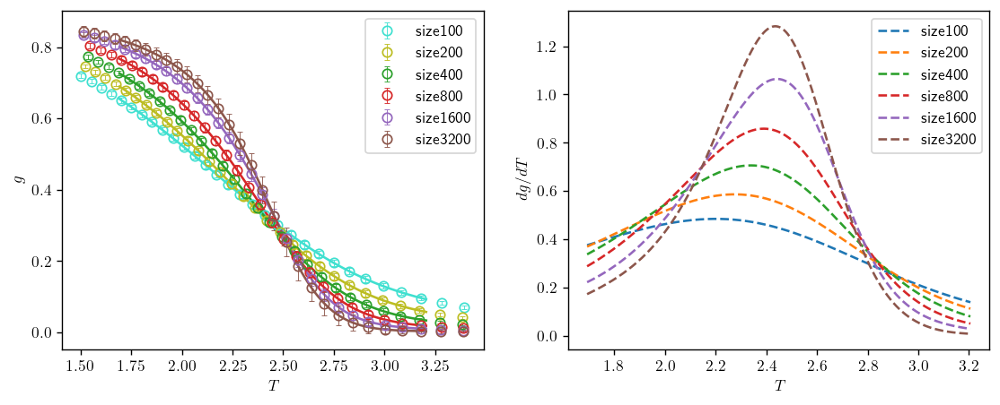

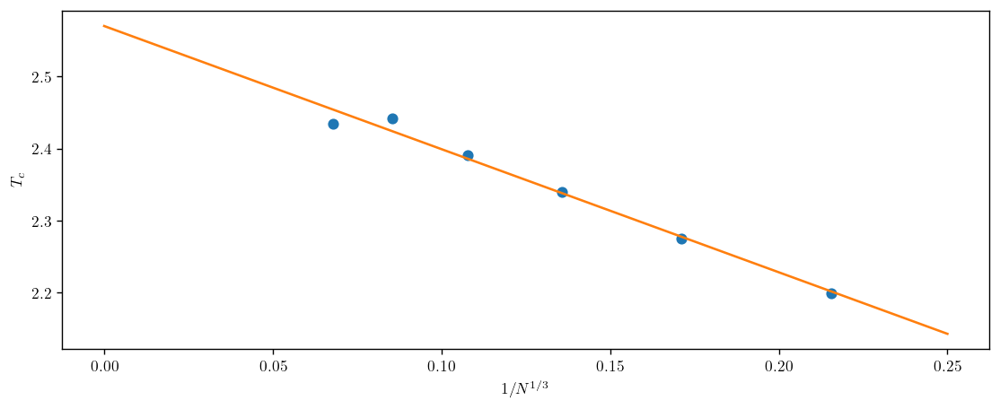

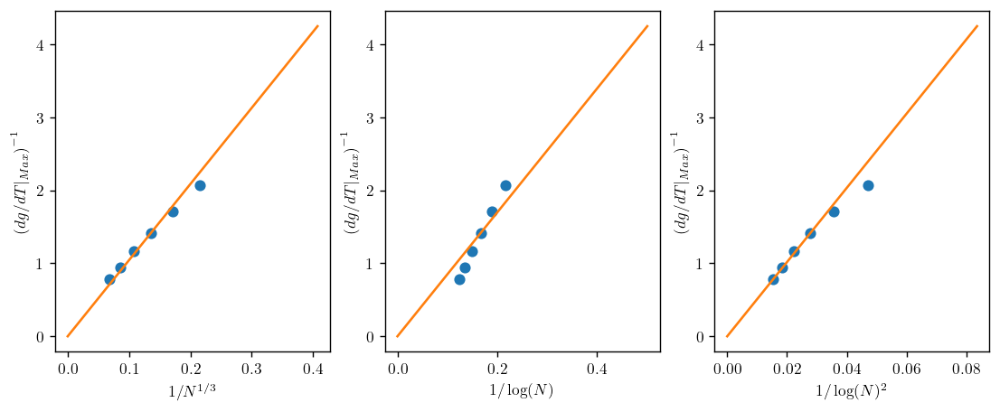

In [6]:
# Pade approximants
pf.pade_fss_analysis(sizes, T_vs_size, B_vs_size,  error_vs_size, figsize_in=(16/1.5,6/1.5), dpi_in=125)

# 2D Small World

In [7]:
adj_index = 8

adjacency = adjacencies[adj_index]
T0 = T0_vs_adj[adj_index]
Tf = Tf_vs_adj[adj_index]
add = add_vs_adj[adj_index]
max_MCSs = max_MCSs_vs_adj[adj_index]

In [8]:
sizes = [100, 200, 400, 800, 1600]

n=100, MCS_avg=40000, N_configs=15368
n=200, MCS_avg=40000, N_configs=15069
n=400, MCS_avg=80000, N_configs=14751
n=800, MCS_avg=160000, N_configs=6760
n=1600, MCS_avg=320000, N_configs=2968


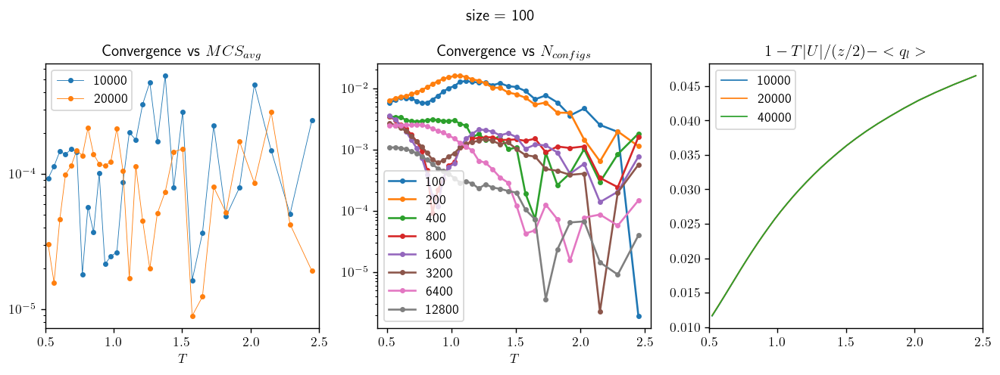

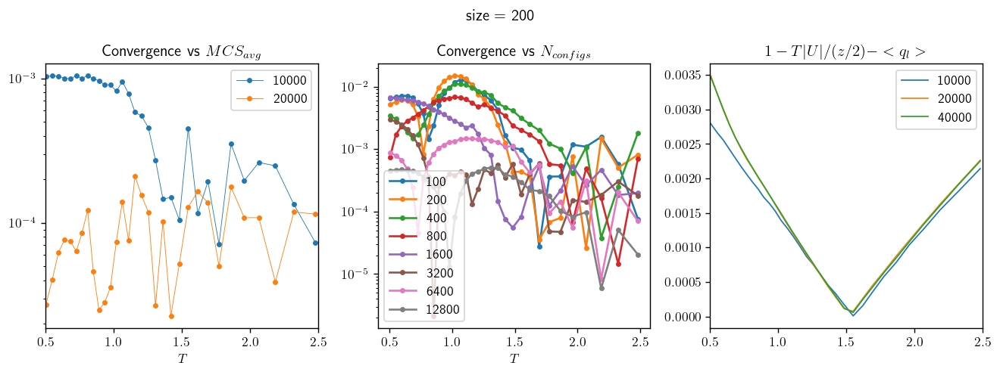

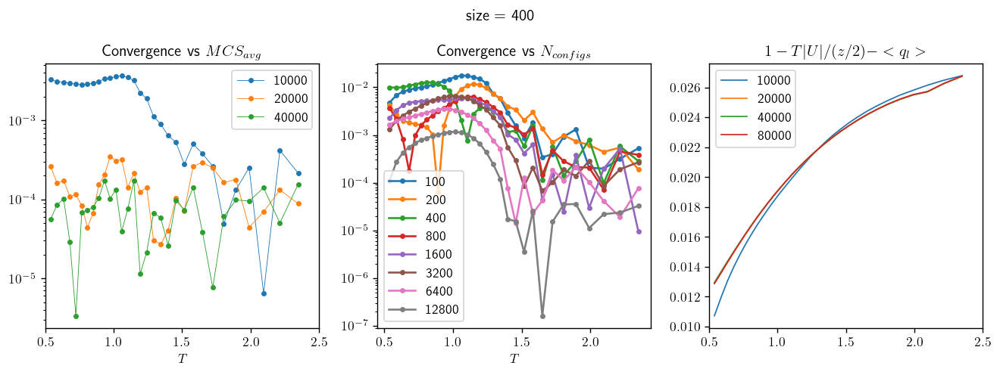

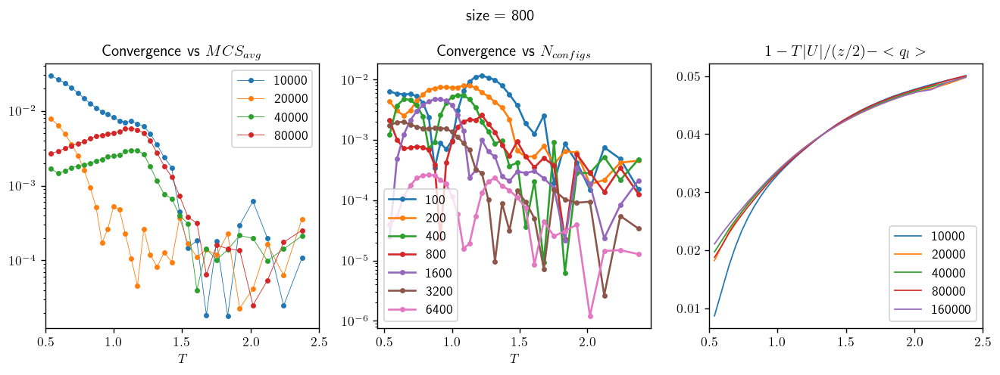

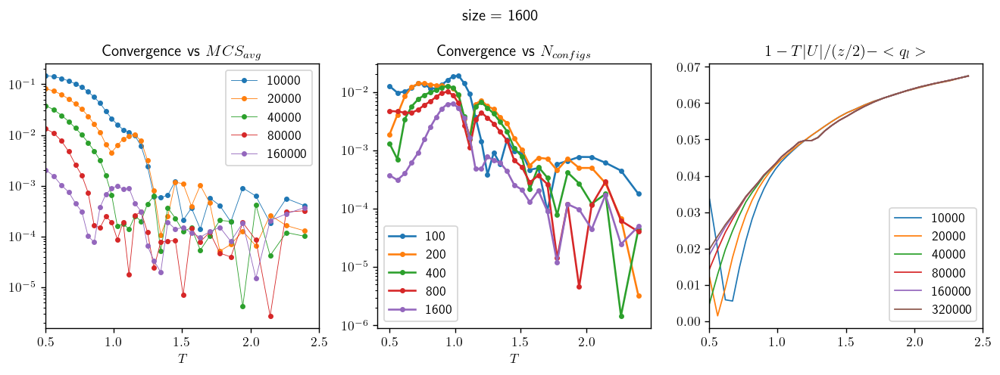

In [9]:
# Read data and plot convergence of simulations
T_vs_size, B_vs_size, error_vs_size = \
rfc.B_vs_MCSavg_Nconf(adjacency, distribution, sizes, add, T0, Tf, MCS_avg_0, max_MCSs, figsize_in=(16/1.5,6/1.5), dpi_in=125)

/home/gabriel/OneDrive/2021/Avaqus/Architecture_v2/Modules/pade_fits.py:389: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  fT, fT_d, d2T, l_rchi = pade_best(Tfit[0:nf], Ofit[0:nf], np.array(Ofit_er[0:nf]), ntr=4, ic=[5], jc=[6, 7])


best estimation has order 5 6   and rchi 0.0001351514904174501
best estimation has order 5 6   and rchi 0.0005011287580674322
best estimation has order 5 6   and rchi 0.00036311736005083115
best estimation has order 5 6   and rchi 0.0005252603921790888
best estimation has order 5 6   and rchi 0.003510246242723095
best estimation has order 5 7   and rchi 0.0001420546034980651
best estimation has order 5 7   and rchi 0.0005261490101090302
best estimation has order 5 7   and rchi 0.0003658144575271126
best estimation has order 5 7   and rchi 0.0005516411236606355
best estimation has order 5 7   and rchi 0.0022696831627923007
[0.0001420546034980651, 0.0005261490101090302, 0.0003658144575271126, 0.0005516411236606355, 0.003510246242723095]
[-1.60774596  1.13603167]


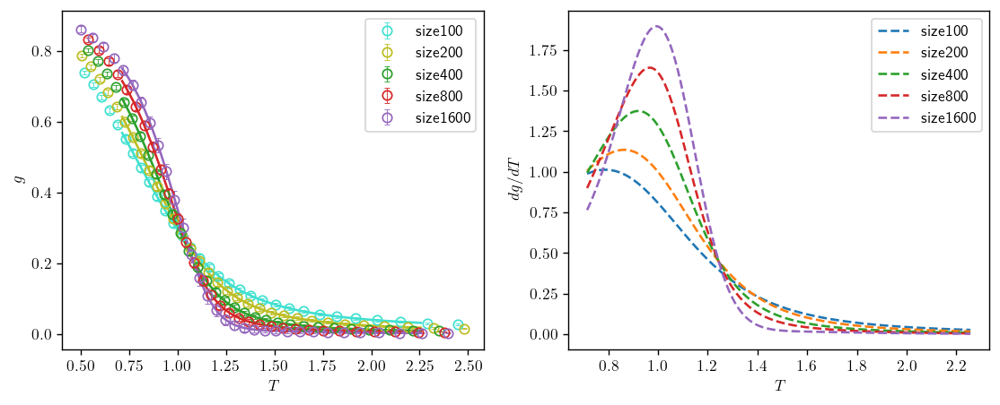

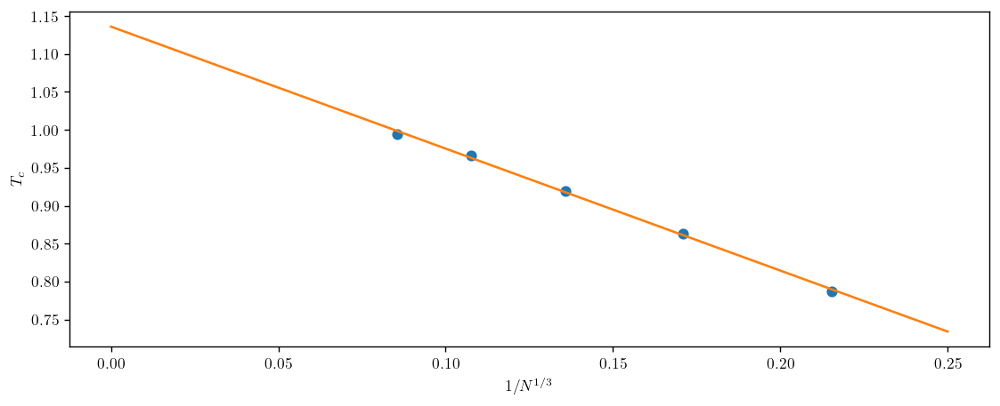

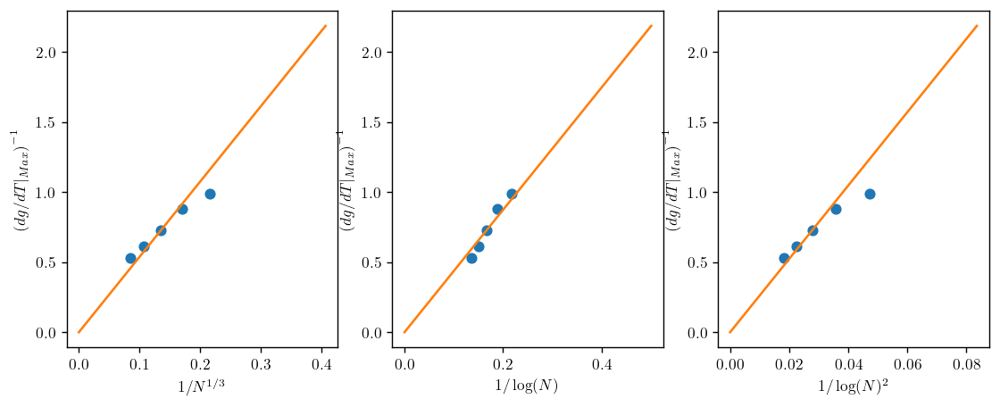

In [10]:
# Pade approximants
pf.pade_fss_analysis(sizes, T_vs_size, B_vs_size,  error_vs_size, figsize_in=(16/1.5,6/1.5), dpi_in=125)

# Chimera

In [3]:
adj_index = 9

adjacency = adjacencies[adj_index]
T0 = T0_vs_adj[adj_index]
Tf = Tf_vs_adj[adj_index]
add = add_vs_adj[adj_index]
max_MCSs = max_MCSs_vs_adj[adj_index]

In [4]:
sizes = [100, 200, 400, 800]

n=100, MCS_avg=40000, N_configs=1638
n=200, MCS_avg=40000, N_configs=1138
n=400, MCS_avg=80000, N_configs=1042
n=800, MCS_avg=160000, N_configs=475


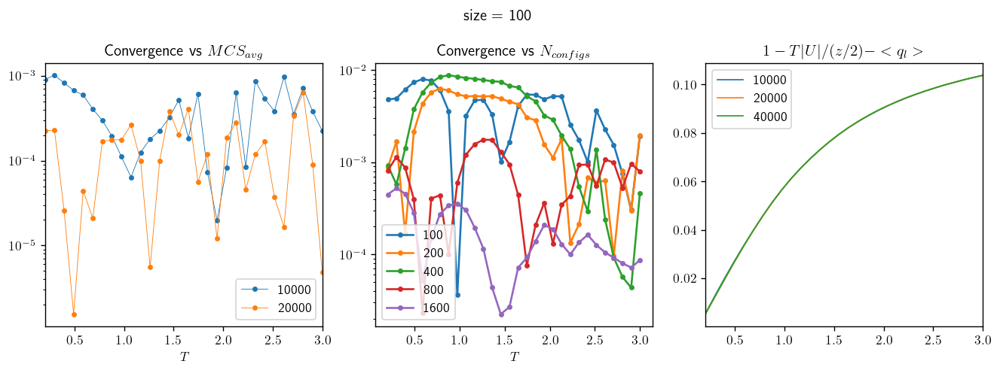

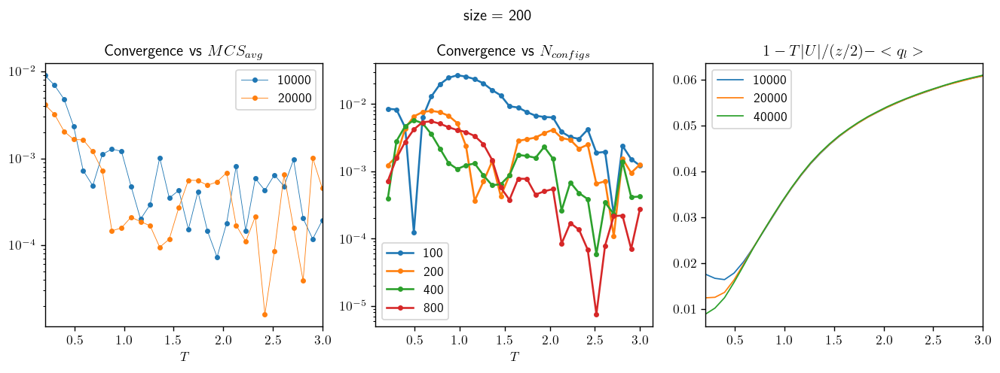

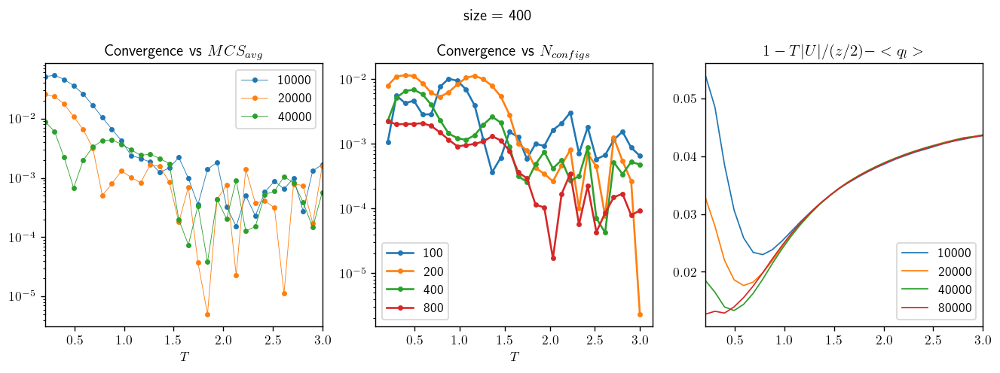

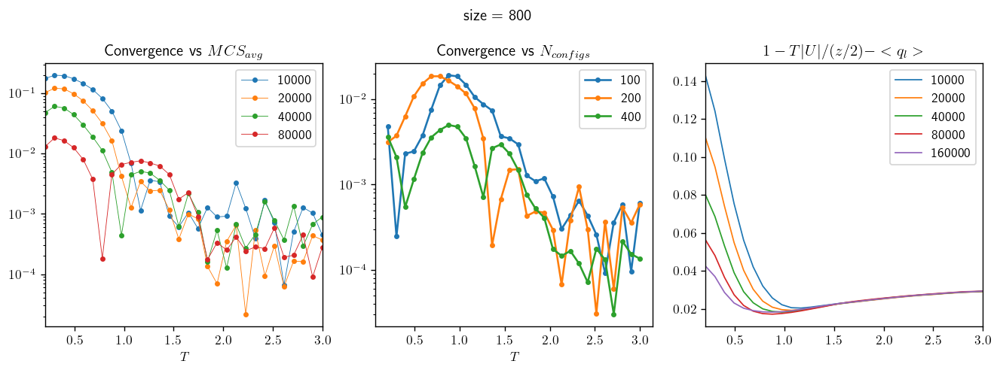

In [5]:
# Read data and plot convergence of simulations
T_vs_size, B_vs_size, error_vs_size = \
rfc.B_vs_MCSavg_Nconf(adjacency, distribution, sizes, add, T0, Tf, MCS_avg_0, max_MCSs, figsize_in=(16/1.5,6/1.5), dpi_in=125)

best estimation has order 5 6   and rchi 0.00029493922435150317
best estimation has order 5 6   and rchi 0.0002721781311377819
best estimation has order 5 6   and rchi 0.0013255302385142165
best estimation has order 5 6   and rchi 0.00022856714135076786
best estimation has order 5 7   and rchi 0.00030807923616045133
best estimation has order 5 7   and rchi 0.0002845145773882519
best estimation has order 5 7   and rchi 0.0013796351410737433
best estimation has order 5 7   and rchi 0.00021932036158620242
[0.00030807923616045133, 0.0002845145773882519, 0.0013796351410737433, 0.00022856714135076786]
[1.31554525 0.86423127]


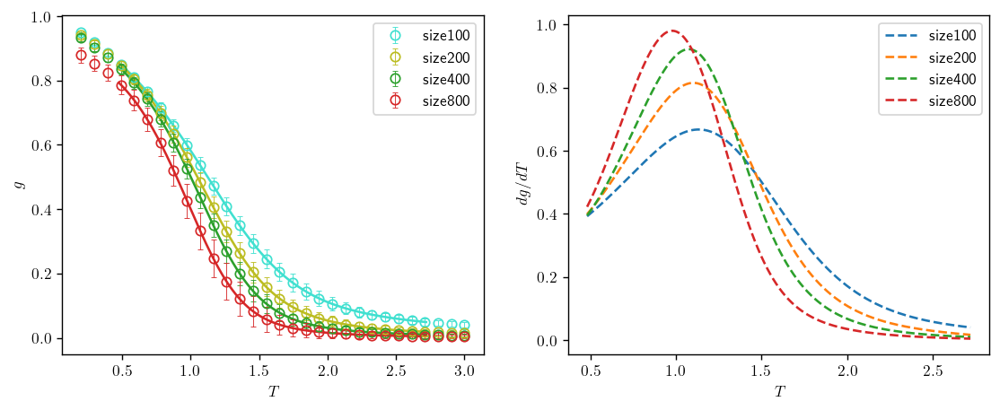

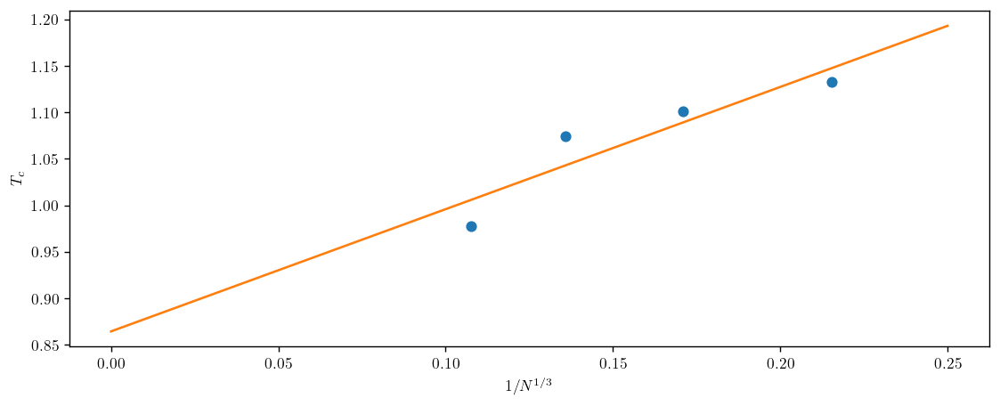

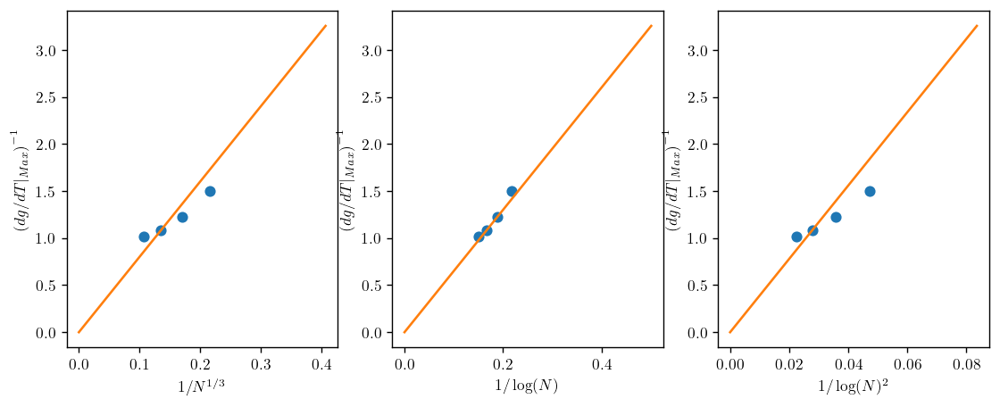

In [6]:
# Pade approximants
pf.pade_fss_analysis(sizes, T_vs_size, B_vs_size,  error_vs_size, figsize_in=(16/1.5,6/1.5), dpi_in=125)

In [ ]:
# Tc vs adjacency
Tc_vs_adj = []
error_Tc_vs_adj = []

for adj_index in range(8):
    adjacency = adjacencies[adj_index]
    T0 = T0_vs_adj[adj_index]
    Tf = Tf_vs_adj[adj_index]
    add = add_vs_adj[adj_index]
    max_MCSs = max_MCSs_vs_adj[adj_index]

    B_bootstrap_vs_size = rfc.B_bootstrap_max_MCS(adjacency, distribution, sizes, add, T0, Tf, MCS_avg_0, max_MCSs, n_bootstrap=2)
    Tc_bootstrap = pf.estimate_Tc_with_pade_bootstrap(sizes, T_vs_size, error_extrapolated_vs_size, B_bootstrap_vs_size, T_term=0, ic=[5], jc=[6])
    Tc_vs_adj.append(np.nanmean(Tc_bootstrap))
    error_Tc_vs_adj.append(np.nanstd(Tc_bootstrap))

